In [1]:
%env CUDA_VISIBLE_DEVICES=3

env: CUDA_VISIBLE_DEVICES=3


In [2]:
import sys
sys.path.append('..')
from contrib.DMI.SST.data import *
from contrib.DMI.SST.load_data import *
from src.utils import *
from src.models import *
import matplotlib.pyplot as plt
import torch
import itertools

lon_min = -10
lon_max = 30
lat_min = 48
lat_max = 66

datamodule = BaseDataModule_wgeo(input_da=load_data_wgeo(path_obs="/Odyssey/private/m19beauc/DMI/training_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC.nc",
                                                      path_tgt="/Odyssey/private/m19beauc/DMI/training_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC.nc",     
                                                      path_oi="/Odyssey/private/m19beauc/DMI/training_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC.nc",
                                                      path_topo="/Odyssey/private/m19beauc/DMI/training_dataset/DMI-TOPO_NSEABALTIC.nc",
                                                      path_fgstd="/Odyssey/private/m19beauc/DMI/training_dataset/DMI-FGSTD_NSEABALTIC.nc"),
                            domains={'train': {'time': slice('2019-05-01', '2020-12-31',)},
                                     'val': {'time': [ slice('2021-01-01', '2021-01-31',),
                                                       slice('2021-04-01', '2021-04-30',),
                                                       slice('2021-07-01', '2021-07-31',),
                                                       slice('2021-10-01', '2021-10-31',) ]},
                                     'test': {'time': slice('2021-06-01', '2021-06-30',)}},
                            xrds_kw={'patch_dims': {'time': 7, 'lat': 240, 'lon': 240},
                                     'strides': {'time': 1, 'lat': 5, 'lon': 5},
                                     'strides_test': {'time': 1, 'lat': 200, 'lon': 200},
                                     'domain_limits':  dict(lon=slice(lon_min, lon_max,),
                                                            lat=slice(lat_min, lat_max,)),
                                     },
                            dl_kw={'batch_size': 2, 'num_workers': 0},
                            res=0.02,
                            pads=[False,False,True],
                            norm_stats =[283.8052,4.2381434])
datamodule.setup()
data_loader = datamodule.train_dataloader()
test_dataloader = datamodule.test_dataloader()

ModuleNotFoundError: No module named 'contrib'

In [3]:
import sys
sys.path.append('../..')
from contrib.DMI.SST.data import *
from contrib.DMI.SST.load_data import *
from src.utils import *
from src.models import *

import matplotlib.pyplot as plt
import torch
import itertools

workdir="/dmidata/users/maxb"
workdir="/Odyssey/private/m19beauc/DMI"
lon_min = -10
lon_max = 30
lat_min = 48
lat_max = 66

lon_min = 0
lon_max = 4.8
lat_min = 55
lat_max = 59.8
datamodule = BaseDataModule_wcoarse_wgeo(input_da=load_data_wcoarse_wgeo(path_obs=workdir+"/training_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_w4DVarNet_coarse.nc",
  path_tgt=workdir+"/training_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_w4DVarNet_coarse.nc",     
  path_oi=workdir+"/training_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC.nc",
  path_coarse=workdir+"/training_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_w4DVarNet_coarse.nc",
  path_topo=workdir+"/training_dataset/DMI-TOPO_NSEABALTIC.nc",
  path_fgstd=workdir+"/training_dataset/DMI-FGSTD_NSEABALTIC.nc"),
              domains={'train': {'time': slice('2019-05-01', '2020-12-31',)},
                                     'val': {'time': [ slice('2021-01-01', '2021-01-31',),
                                                       slice('2021-04-01', '2021-04-30',),
                                                       slice('2021-07-01', '2021-07-31',),
                                                       slice('2021-10-01', '2021-10-31',) ]},
                                     'test': {'time': slice('2021-06-01', '2021-06-30',)}},
                        xrds_kw={'patch_dims': {'time': 7, 'lat': 240, 'lon': 240},
                                     'strides': {'time': 1, 'lat': 5, 'lon': 5},
                                     'strides_test': {'time': 1, 'lat': 200, 'lon': 200},
                                     'domain_limits':  dict(lon=slice(lon_min, lon_max,),
                                                            lat=slice(lat_min, lat_max,)),
                                     },
                            dl_kw={'batch_size': 2, 'num_workers': 0},
                            res=0.02,
                            pads=[False,False,True],
                            norm_stats =[-0.015420883207237286,0.4562528584789277])
datamodule.setup()
data_loader = datamodule.train_dataloader()
test_dataloader = datamodule.test_dataloader()

/homes/m19beauc/miniconda3/envs/4dvarnet/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/homes/m19beauc/4dvarnet-starter/Notebooks/Notebook_DMI/../../contrib/DMI/SST/load_data.py:83: RuntimeWarning: invalid value encountered in log
  'topo':(('lat','lon'),np.log(-1.*topo.topo.data+1)),
/homes/m19beauc/4dvarnet-starter/Notebooks/Notebook_DMI/../../contrib/DMI/SST/data.py:139: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  da_dims = dict(zip(self.da.dims.keys(), self.da.dims.values()))


In [ ]:
import cmocean as cmo
k=30
my_sample = next(itertools.islice(data_loader, k, None))

vmax = 2
vmin = -2.
cmap = plt.cm.seismic
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)

fig = plt.figure(figsize=(15,5))
y = my_sample[0]
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),y[0])},
           coords={'time':np.arange(7),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',cmap=cmap,
                                                            col_wrap=7,
                                                            vmin=vmin,vmax=vmax,
                                                            add_colorbar=False)

plt.savefig('/Odyssey/private/m19beauc/more_gappy_inputs.pdf', bbox_inches='tight')


fig = plt.figure(figsize=(15,5))
y = my_sample[1]
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),y[0])},
           coords={'time':np.arange(7),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',cmap=cmap,
                                                            col_wrap=7,
                                                            vmin=vmin,vmax=vmax,
                                                            add_colorbar=False)
plt.savefig('/Odyssey/private/m19beauc/gappy_targets.pdf', bbox_inches='tight')

fig = plt.figure(figsize=(15,2))
# Colorbar
cbar_ax = fig.add_axes([0.1, 0.1, 0.8, 0.1])
cbar_ax.tick_params(labelsize=20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', pad=3.0)
cbar.ax.set_title("[K]",fontsize=22,y=-3.5)
plt.savefig('/Odyssey/private/m19beauc/standalone_colorbars.pdf', bbox_inches='tight')

# 1. Self attention mechanisms

In [4]:
import torch
from torch import nn
from torch.nn import functional as F
import math

class SelfAttention(nn.Module):
    def __init__(self, n_heads, d_embed, in_proj_bias=True, out_proj_bias=True):
        super().__init__()
        # This combines the Wq, Wk and Wv matrices into one matrix
        self.in_proj = nn.Linear(d_embed, 3 * d_embed, bias=in_proj_bias)
        # This one represents the Wo matrix
        self.out_proj = nn.Linear(d_embed, d_embed, bias=out_proj_bias)
        self.n_heads = n_heads
        self.d_head = d_embed // n_heads

    def forward(self, x, causal_mask=False):
        # x: # (Batch_Size, Seq_Len, Dim)

        # (Batch_Size, Seq_Len, Dim)
        input_shape = x.shape 
        
        # (Batch_Size, Seq_Len, Dim)
        batch_size, sequence_length, d_embed = input_shape 

        # (Batch_Size, Seq_Len, H, Dim / H)
        interim_shape = (batch_size, sequence_length, self.n_heads, self.d_head) 

        # (Batch_Size, Seq_Len, Dim) -> (Batch_Size, Seq_Len, Dim * 3) -> 3 tensor of shape (Batch_Size, Seq_Len, Dim)
        q, k, v = self.in_proj(x).chunk(3, dim=-1)
        
        # (Batch_Size, Seq_Len, Dim) -> (Batch_Size, Seq_Len, H, Dim / H) -> (Batch_Size, H, Seq_Len, Dim / H)
        q = q.view(interim_shape).transpose(1, 2)
        k = k.view(interim_shape).transpose(1, 2)
        v = v.view(interim_shape).transpose(1, 2)

        # (Batch_Size, H, Seq_Len, Dim / H) @ (Batch_Size, H, Dim / H, Seq_Len) -> (Batch_Size, H, Seq_Len, Seq_Len)
        weight = q @ k.transpose(-1, -2)
        
        if causal_mask:
            # Mask where the upper triangle (above the principal diagonal) is 1
            mask = torch.ones_like(weight, dtype=torch.bool).triu(1) 
            # Fill the upper triangle with -inf
            weight.masked_fill_(mask, -torch.inf) 
        
        # Divide by d_k (Dim / H). 
        # (Batch_Size, H, Seq_Len, Seq_Len) -> (Batch_Size, H, Seq_Len, Seq_Len)
        weight /= math.sqrt(self.d_head) 
        # (Batch_Size, H, Seq_Len, Seq_Len) -> (Batch_Size, H, Seq_Len, Seq_Len)
        weight = F.softmax(weight, dim=-1) 
        # (Batch_Size, H, Seq_Len, Seq_Len) @ (Batch_Size, H, Seq_Len, Dim / H) -> (Batch_Size, H, Seq_Len, Dim / H)
        output = weight @ v
        # (Batch_Size, H, Seq_Len, Dim / H) -> (Batch_Size, Seq_Len, H, Dim / H)
        output = output.transpose(1, 2) 
        # (Batch_Size, Seq_Len, H, Dim / H) -> (Batch_Size, Seq_Len, Dim)
        output = output.reshape(input_shape) 
        # (Batch_Size, Seq_Len, Dim) -> (Batch_Size, Seq_Len, Dim)
        output = self.out_proj(output) 
        # (Batch_Size, Seq_Len, Dim)
        return output

class CrossAttention(nn.Module):
    def __init__(self, n_heads, d_embed, d_cross, in_proj_bias=True, out_proj_bias=True):
        super().__init__()
        self.q_proj   = nn.Linear(d_embed, d_embed, bias=in_proj_bias)
        self.k_proj   = nn.Linear(d_cross, d_embed, bias=in_proj_bias)
        self.v_proj   = nn.Linear(d_cross, d_embed, bias=in_proj_bias)
        self.out_proj = nn.Linear(d_embed, d_embed, bias=out_proj_bias)
        self.n_heads = n_heads
        self.d_head = d_embed // n_heads
    
    def forward(self, x, y):
        # x (latent): # (Batch_Size, Seq_Len_Q, Dim_Q)
        # y (context): # (Batch_Size, Seq_Len_KV, Dim_KV) = (Batch_Size, 77, 768)

        input_shape = x.shape
        batch_size, sequence_length, d_embed = input_shape
        # Divide each embedding of Q into multiple heads such that d_heads * n_heads = Dim_Q
        interim_shape = (batch_size, -1, self.n_heads, self.d_head)
        
        # (Batch_Size, Seq_Len_Q, Dim_Q) -> (Batch_Size, Seq_Len_Q, Dim_Q)
        q = self.q_proj(x)
        # (Batch_Size, Seq_Len_KV, Dim_KV) -> (Batch_Size, Seq_Len_KV, Dim_Q)
        k = self.k_proj(y)
        # (Batch_Size, Seq_Len_KV, Dim_KV) -> (Batch_Size, Seq_Len_KV, Dim_Q)
        v = self.v_proj(y)

        # (Batch_Size, Seq_Len_Q, Dim_Q) -> (Batch_Size, Seq_Len_Q, H, Dim_Q / H) -> (Batch_Size, H, Seq_Len_Q, Dim_Q / H)
        q = q.view(interim_shape).transpose(1, 2) 
        # (Batch_Size, Seq_Len_KV, Dim_Q) -> (Batch_Size, Seq_Len_KV, H, Dim_Q / H) -> (Batch_Size, H, Seq_Len_KV, Dim_Q / H)
        k = k.view(interim_shape).transpose(1, 2) 
        # (Batch_Size, Seq_Len_KV, Dim_Q) -> (Batch_Size, Seq_Len_KV, H, Dim_Q / H) -> (Batch_Size, H, Seq_Len_KV, Dim_Q / H)
        v = v.view(interim_shape).transpose(1, 2) 
        
        # (Batch_Size, H, Seq_Len_Q, Dim_Q / H) @ (Batch_Size, H, Dim_Q / H, Seq_Len_KV) -> (Batch_Size, H, Seq_Len_Q, Seq_Len_KV)
        weight = q @ k.transpose(-1, -2)
        # (Batch_Size, H, Seq_Len_Q, Seq_Len_KV)
        weight /= math.sqrt(self.d_head)
        # (Batch_Size, H, Seq_Len_Q, Seq_Len_KV)
        weight = F.softmax(weight, dim=-1)
        # (Batch_Size, H, Seq_Len_Q, Seq_Len_KV) @ (Batch_Size, H, Seq_Len_KV, Dim_Q / H) -> (Batch_Size, H, Seq_Len_Q, Dim_Q / H)
        output = weight @ v
        # (Batch_Size, H, Seq_Len_Q, Dim_Q / H) -> (Batch_Size, Seq_Len_Q, H, Dim_Q / H)
        output = output.transpose(1, 2).contiguous()
        # (Batch_Size, Seq_Len_Q, H, Dim_Q / H) -> (Batch_Size, Seq_Len_Q, Dim_Q)
        output = output.view(input_shape)
        # (Batch_Size, Seq_Len_Q, Dim_Q) -> (Batch_Size, Seq_Len_Q, Dim_Q)
        output = self.out_proj(output)
        # (Batch_Size, Seq_Len_Q, Dim_Q)
        return output

# 2. VAE architectures

In [5]:
###############################################################################
# BSD 3-Clause License
#
# Copyright (c) 2018, NVIDIA CORPORATION. All rights reserved.
#
# Author & Contact: Guilin Liu (guilinl@nvidia.com)
###############################################################################

import torch
import torch.nn.functional as F
from torch import nn, cuda
from torch.autograd import Variable

class PConv2d(nn.Conv2d):
    def __init__(self, *args, **kwargs):

        # whether the mask is multi-channel or not
        if 'multi_channel' in kwargs:
            self.multi_channel = kwargs['multi_channel']
            kwargs.pop('multi_channel')
        else:
            self.multi_channel = False  

        if 'return_mask' in kwargs:
            self.return_mask = kwargs['return_mask']
            kwargs.pop('return_mask')
        else:
            self.return_mask = False

        super(PConv2d, self).__init__(*args, **kwargs)

        if self.multi_channel:
            self.weight_maskUpdater = torch.ones(self.out_channels, self.in_channels, self.kernel_size[0], self.kernel_size[1])
        else:
            self.weight_maskUpdater = torch.ones(1, 1, self.kernel_size[0], self.kernel_size[1])
            
        self.slide_winsize = self.weight_maskUpdater.shape[1] * self.weight_maskUpdater.shape[2] * self.weight_maskUpdater.shape[3]

        self.last_size = (None, None, None, None)
        self.update_mask = None
        self.mask_ratio = None

    def forward(self, input, mask_in=None):
        assert len(input.shape) == 4
        if mask_in is not None or self.last_size != tuple(input.shape):
            self.last_size = tuple(input.shape)

            with torch.no_grad():
                if self.weight_maskUpdater.type() != input.type():
                    self.weight_maskUpdater = self.weight_maskUpdater.to(input)

                if mask_in is None:
                    # if mask is not provided, create a mask
                    if self.multi_channel:
                        mask = torch.ones(input.data.shape[0], input.data.shape[1], input.data.shape[2], input.data.shape[3]).to(input)
                    else:
                        mask = torch.ones(1, 1, input.data.shape[2], input.data.shape[3]).to(input)
                else:
                    mask = mask_in
                        
                self.update_mask = F.conv2d(mask, self.weight_maskUpdater, bias=None, stride=self.stride, padding=self.padding, dilation=self.dilation, groups=1)

                # for mixed precision training, change 1e-8 to 1e-6
                self.mask_ratio = self.slide_winsize/(self.update_mask + 1e-8)
                # self.mask_ratio = torch.max(self.update_mask)/(self.update_mask + 1e-8)
                self.update_mask = torch.clamp(self.update_mask, 0, 1)
                self.mask_ratio = torch.mul(self.mask_ratio, self.update_mask)


        raw_out = super(PConv2d, self).forward(torch.mul(input, mask) if mask_in is not None else input)

        if self.bias is not None:
            bias_view = self.bias.view(1, self.out_channels, 1, 1)
            output = torch.mul(raw_out - bias_view, self.mask_ratio) + bias_view
            output = torch.mul(output, self.update_mask)
        else:
            output = torch.mul(raw_out, self.mask_ratio)


        if self.return_mask:
            return output, self.update_mask
        else:
            return output

In [6]:
import torch
from torch import nn
from torch.nn import functional as F

class VAE_PAttentionBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.groupnorm = nn.GroupNorm(32, channels)
        self.attention = SelfAttention(1, 2*channels)
    
    def forward(self, x, mask):
        # x: (Batch_Size, Features, Height, Width)

        residue = x 

        # (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height, Width)
        x = self.groupnorm(x)
        x = torch.cat([x,mask], dim=1)
        
        n, c, h, w = x.shape
        
        # (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height * Width)
        x = x.view((n, c, h * w)) 
        # (Batch_Size, Features, Height * Width) -> (Batch_Size, Height * Width, Features). Each pixel becomes a feature of size "Features", the sequence length is "Height * Width".
        x = x.transpose(-1, -2)
        # Perform self-attention WITHOUT mask
        # (Batch_Size, Height * Width, Features) -> (Batch_Size, Height * Width, Features)
        x = self.attention(x)
        # (Batch_Size, Height * Width, Features) -> (Batch_Size, Features, Height * Width)
        x = x.transpose(-1, -2)
        # (Batch_Size, Features, Height * Width) -> (Batch_Size, Features, Height, Width)
        x = x.view((n, c, h, w))
        x, mask = x[:,:(c//2),:,:] , mask
        # (Batch_Size, Features, Height, Width) + (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height, Width) 
        x += residue

        # (Batch_Size, Features, Height, Width)
        return x, mask

class VAE_PResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.groupnorm_1 = nn.GroupNorm(32, in_channels)
        self.conv_1 = PConv2d(in_channels, out_channels, kernel_size=3, padding=1, multi_channel=True, return_mask=True)

        self.groupnorm_2 = nn.GroupNorm(32, out_channels)
        self.conv_2 = PConv2d(out_channels, out_channels, kernel_size=3, padding=1, multi_channel=True,return_mask=True)

        if in_channels == out_channels:
            self.residual_layer = nn.Identity()
        else:
            self.residual_layer = PConv2d(in_channels, out_channels, kernel_size=1, padding=0, multi_channel=True, return_mask=True)
    
    def forward(self, x, mask):
        # x: (Batch_Size, In_Channels, Height, Width)

        residue = x
        residue_mask = mask
                
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, In_Channels, Height, Width)
        x = self.groupnorm_1(x)
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, In_Channels, Height, Width)
        x = F.silu(x)
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x, mask = self.conv_1(x, mask)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = self.groupnorm_2(x)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = F.silu(x)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x, mask = self.conv_2(x, mask)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        if isinstance(self.residual_layer,nn.Identity):
            return x + self.residual_layer(residue), mask
        else:
            res, mask = self.residual_layer(residue, residue_mask)
            return x + res, mask

class VAE_AttentionBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.groupnorm = nn.GroupNorm(32, channels)
        self.attention = SelfAttention(1, channels)
    
    def forward(self, x):
        # x: (Batch_Size, Features, Height, Width)

        residue = x 

        # (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height, Width)
        x = self.groupnorm(x)
        
        n, c, h, w = x.shape
        # (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height * Width)
        x = x.view((n, c, h * w)) 
        # (Batch_Size, Features, Height * Width) -> (Batch_Size, Height * Width, Features). Each pixel becomes a feature of size "Features", the sequence length is "Height * Width".
        x = x.transpose(-1, -2)
        # Perform self-attention WITHOUT mask
        # (Batch_Size, Height * Width, Features) -> (Batch_Size, Height * Width, Features)
        x = self.attention(x)
        # (Batch_Size, Height * Width, Features) -> (Batch_Size, Features, Height * Width)
        x = x.transpose(-1, -2)
        # (Batch_Size, Features, Height * Width) -> (Batch_Size, Features, Height, Width)
        x = x.view((n, c, h, w))
        # (Batch_Size, Features, Height, Width) + (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height, Width) 
        x += residue

        # (Batch_Size, Features, Height, Width)
        return x

class VAE_ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.groupnorm_1 = nn.GroupNorm(32, in_channels)
        self.conv_1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)

        self.groupnorm_2 = nn.GroupNorm(32, out_channels)
        self.conv_2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)

        if in_channels == out_channels:
            self.residual_layer = nn.Identity()
        else:
            self.residual_layer = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0)
            
    def forward(self, x):
        # x: (Batch_Size, In_Channels, Height, Width)

        residue = x
                
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, In_Channels, Height, Width)
        x = self.groupnorm_1(x)
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, In_Channels, Height, Width)
        x = F.silu(x)
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x  = self.conv_1(x)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = self.groupnorm_2(x)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = F.silu(x)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = self.conv_2(x)
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)

        return x + self.residual_layer(residue)

    
class VAE_Encoder(nn.Sequential):
    def __init__(self, in_channels=9, out_channels=28):
        super().__init__(
            # (Batch_Size, Channel, Height, Width) -> (Batch_Size, 128, Height, Width)
            PConv2d(in_channels, 128, kernel_size=3, padding=1,multi_channel=True, return_mask=True),  
             # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_PResidualBlock(128, 128),
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_PResidualBlock(128, 128),
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height / 2, Width / 2)
            PConv2d(128, 128, kernel_size=3, stride=2, padding=0, multi_channel=True,return_mask=True),
            # (Batch_Size, 128, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_PResidualBlock(128, 256), 
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            #VAE_PResidualBlock(256, 256), 
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 4, Width / 4)
            PConv2d(256, 256, kernel_size=3, stride=2, padding=0,multi_channel=True, return_mask=True), 
            # (Batch_Size, 256, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_PResidualBlock(256, 512), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            #VAE_PResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 8, Width / 8)
            #PConv2d(512, 512, kernel_size=3, stride=2, padding=0,multi_channel=True, return_mask=True), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            #VAE_PResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            #VAE_PResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_PResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_PAttentionBlock(512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_PResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.GroupNorm(32, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.SiLU(), 

            # Because the padding=1, it means the width and height will increase by 2
            # Out_Height = In_Height + Padding_Top + Padding_Bottom
            # Out_Width = In_Width + Padding_Left + Padding_Right
            # Since padding = 1 means Padding_Top = Padding_Bottom = Padding_Left = Padding_Right = 1,
            # Since the Out_Width = In_Width + 2 (same for Out_Height), it will compensate for the Kernel size of 3
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8). 
            PConv2d(512, out_channels, kernel_size=3, padding=1, multi_channel=True,return_mask=True), 

            # (Batch_Size, 8, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8)
            PConv2d(out_channels, out_channels, kernel_size=1, padding=0, multi_channel=True, return_mask=True), 
        )

    def forward(self, x):
        # x: (Batch_Size, Channel, Height, Width)
        # noise: (Batch_Size, 4, Height / 8, Width / 8)

        mask = torch.where(x==0.,0.,1.)
        
        for module in self:

            if getattr(module, 'stride', None) == (2, 2):  # Padding at downsampling should be asymmetric (see #8)
                # Pad: (Padding_Left, Padding_Right, Padding_Top, Padding_Bottom).
                # Pad with zeros on the right and bottom.
                # (Batch_Size, Channel, Height, Width) -> (Batch_Size, Channel, Height + Padding_Top + Padding_Bottom, Width + Padding_Left + Padding_Right) = (Batch_Size, Channel, Height + 1, Width + 1)
                x = F.pad(x, (0, 1, 0, 1))
                mask = F.pad(mask, (0, 1, 0, 1))
                
            if (isinstance(module, nn.GroupNorm) or isinstance(module, nn.SiLU)):
                x = module(x)
            else:
                x, mask = module(x,mask)
        
        # (Batch_Size, 8, Height / 8, Width / 8) -> two tensors of shape (Batch_Size, 4, Height / 8, Width / 8)
        mean, log_variance = torch.chunk(x, 2, dim=1)
        
        # Clamp the log variance between -30 and 20, so that the variance is between (circa) 1e-14 and 1e8. 
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        log_variance = torch.clamp(log_variance, -30, 20)
        
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        variance = log_variance.exp()
        
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        stdev = variance.sqrt()
        
        # reparametrization trick: Transform N(0, 1) -> N(mean, stdev) 
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        noise = torch.Tensor(np.random.normal(size=mean.size(), scale=1.0)).to(x.device)
        x = mean + stdev * noise
        
        # Scale by a constant
        # Constant taken from: https://github.com/CompVis/stable-diffusion/blob/21f890f9da3cfbeaba8e2ac3c425ee9e998d5229/configs/stable-diffusion/v1-inference.yaml#L17C1-L17C1
        x *= 0.18215
                
        return x, mean, log_variance

class VAE_Decoder(nn.Sequential):
    def __init__(self,in_channels=14, out_channels=9):
        super().__init__(
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
            nn.Conv2d(in_channels, 4, kernel_size=1, padding=0),
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.Conv2d(4, 512, kernel_size=3, padding=1),   
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_AttentionBlock(512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            #VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            #VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            #VAE_ResidualBlock(512, 512), 
            # Repeats the rows and columns of the data by scale_factor (like when you resize an image by doubling its size).
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 4, Width / 4)
            #nn.Upsample(scale_factor=2),
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            nn.Conv2d(512, 512, kernel_size=3, padding=1), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            #VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            #VAE_ResidualBlock(512, 512), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 2, Width / 2)
            nn.Upsample(scale_factor=2), 
            # (Batch_Size, 512, Height / 2, Width / 2) -> (Batch_Size, 512, Height / 2, Width / 2)
            nn.Conv2d(512, 512, kernel_size=3, padding=1), 
            # (Batch_Size, 512, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(512, 256), 
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(256, 256), 
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            #VAE_ResidualBlock(256, 256), 
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height, Width)
            nn.Upsample(scale_factor=2), 
            # (Batch_Size, 256, Height, Width) -> (Batch_Size, 256, Height, Width)
            nn.Conv2d(256, 256, kernel_size=3, padding=1), 
            # (Batch_Size, 256, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(256, 128), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(128, 128), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(128, 128), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.GroupNorm(32, 128), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.SiLU(), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 3, Height, Width)
            nn.Conv2d(128, out_channels, kernel_size=3, padding=1), 
        )

    def forward(self, x):
        # x: (Batch_Size, 4, Height / 8, Width / 8)
        
        # Remove the scaling added by the Encoder.
        x /= 0.18215

        for module in self:
            x = module(x)

        # (Batch_Size, 3, Height, Width)
        return x

In [7]:
class VAE_Encoder(nn.Sequential):
    def __init__(self, in_channels=9, out_channels=28):
        super().__init__(
            # (Batch_Size, Channel, Height, Width) -> (Batch_Size, 128, Height, Width)
            PConv2d(in_channels, 24, kernel_size=3, padding=1,multi_channel=True, return_mask=True),      
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height / 2, Width / 2)
            PConv2d(24, 48, kernel_size=3, stride=2, padding=0, multi_channel=True,return_mask=True),
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 4, Width / 4)
            PConv2d(48, 96, kernel_size=3, stride=2, padding=0,multi_channel=True, return_mask=True), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 8, Width / 8)
            PConv2d(96, 192, kernel_size=3, stride=2, padding=0,multi_channel=True, return_mask=True), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.GroupNorm(12, 192), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.SiLU(), 
            # Because the padding=1, it means the width and height will increase by 2
            # Out_Height = In_Height + Padding_Top + Padding_Bottom
            # Out_Width = In_Width + Padding_Left + Padding_Right
            # Since padding = 1 means Padding_Top = Padding_Bottom = Padding_Left = Padding_Right = 1,
            # Since the Out_Width = In_Width + 2 (same for Out_Height), it will compensate for the Kernel size of 3
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8). 
            PConv2d(192, out_channels, kernel_size=3, padding=1, multi_channel=True,return_mask=True), 
            # (Batch_Size, 8, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8)
            PConv2d(out_channels, out_channels, kernel_size=1, padding=0, multi_channel=True, return_mask=True), 
        )

    def forward(self, x):
        # x: (Batch_Size, Channel, Height, Width)
        # noise: (Batch_Size, 4, Height / 8, Width / 8)

        mask = torch.where(x==0.,0.,1.)
        
        for module in self:

            if getattr(module, 'stride', None) == (2, 2):  # Padding at downsampling should be asymmetric (see #8)
                # Pad: (Padding_Left, Padding_Right, Padding_Top, Padding_Bottom).
                # Pad with zeros on the right and bottom.
                # (Batch_Size, Channel, Height, Width) -> (Batch_Size, Channel, Height + Padding_Top + Padding_Bottom, Width + Padding_Left + Padding_Right) = (Batch_Size, Channel, Height + 1, Width + 1)
                x = F.pad(x, (0, 1, 0, 1))
                mask = F.pad(mask, (0, 1, 0, 1))
                
            if (isinstance(module, nn.GroupNorm) or isinstance(module, nn.SiLU)):
                x = module(x)
            else:
                x, mask = module(x,mask)
        
        # (Batch_Size, 8, Height / 8, Width / 8) -> two tensors of shape (Batch_Size, 4, Height / 8, Width / 8)
        mean, log_variance = torch.chunk(x, 2, dim=1)
        
        # Clamp the log variance between -30 and 20, so that the variance is between (circa) 1e-14 and 1e8. 
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        log_variance = torch.clamp(log_variance, -30, 20)
        
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        variance = log_variance.exp()
        
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        stdev = variance.sqrt()
        
        # reparametrization trick: Transform N(0, 1) -> N(mean, stdev) 
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        noise = torch.Tensor(np.random.normal(size=mean.size(), scale=1.0)).to(x.device)
        x = mean + stdev * noise
        
        # Scale by a constant
        # Constant taken from: https://github.com/CompVis/stable-diffusion/blob/21f890f9da3cfbeaba8e2ac3c425ee9e998d5229/configs/stable-diffusion/v1-inference.yaml#L17C1-L17C1
        x *= 0.18215
                
        return x, mean, log_variance

class VAE_Decoder(nn.Sequential):
    def __init__(self,in_channels=14, out_channels=9):
        super().__init__(
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
            nn.Conv2d(in_channels, 4, kernel_size=1, padding=0),
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.Conv2d(4, 192, kernel_size=3, padding=1),   
            nn.Upsample(scale_factor=2),
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            nn.Conv2d(192, 96, kernel_size=3, padding=1), 
            nn.Upsample(scale_factor=2), 
            # (Batch_Size, 512, Height / 2, Width / 2) -> (Batch_Size, 512, Height / 2, Width / 2)
            nn.Conv2d(96, 48, kernel_size=3, padding=1), 
            nn.Upsample(scale_factor=2), 
            # (Batch_Size, 256, Height, Width) -> (Batch_Size, 256, Height, Width)
            nn.Conv2d(48, 48, kernel_size=3, padding=1), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.GroupNorm(12, 48), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.SiLU(), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 3, Height, Width)
            nn.Conv2d(48, out_channels, kernel_size=3, padding=1), 
        )

    def forward(self, x):
        # x: (Batch_Size, 4, Height / 8, Width / 8)
        
        # Remove the scaling added by the Encoder.
        x /= 0.18215

        for module in self:
            x = module(x)

        # (Batch_Size, 3, Height, Width)
        return x

In [8]:
class AE_Encoder(nn.Sequential):
    def __init__(self, in_channels=9, out_channels=28):
        super().__init__(
            # (Batch_Size, Channel, Height, Width) -> (Batch_Size, 128, Height, Width)
            PConv2d(in_channels, 24, kernel_size=3, padding=1,multi_channel=True, return_mask=True),      
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height / 2, Width / 2)
            PConv2d(24, 48, kernel_size=3, stride=2, padding=0, multi_channel=True,return_mask=True),
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 4, Width / 4)
            PConv2d(48, 96, kernel_size=3, stride=2, padding=0,multi_channel=True, return_mask=True), 
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 8, Width / 8)
            PConv2d(96, 192, kernel_size=3, stride=2, padding=0,multi_channel=True, return_mask=True), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.GroupNorm(12, 192), 
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.SiLU(), 
            # Because the padding=1, it means the width and height will increase by 2
            # Out_Height = In_Height + Padding_Top + Padding_Bottom
            # Out_Width = In_Width + Padding_Left + Padding_Right
            # Since padding = 1 means Padding_Top = Padding_Bottom = Padding_Left = Padding_Right = 1,
            # Since the Out_Width = In_Width + 2 (same for Out_Height), it will compensate for the Kernel size of 3
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8). 
            PConv2d(192, out_channels, kernel_size=3, padding=1, multi_channel=True,return_mask=True), 
            # (Batch_Size, 8, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8)
            PConv2d(out_channels, out_channels, kernel_size=1, padding=0, multi_channel=True, return_mask=True), 
        )

    def forward(self, x):
        # x: (Batch_Size, Channel, Height, Width)
        # noise: (Batch_Size, 4, Height / 8, Width / 8)

        mask = torch.where(x==0.,0.,1.)
        
        for module in self:

            if getattr(module, 'stride', None) == (2, 2):  # Padding at downsampling should be asymmetric (see #8)
                # Pad: (Padding_Left, Padding_Right, Padding_Top, Padding_Bottom).
                # Pad with zeros on the right and bottom.
                # (Batch_Size, Channel, Height, Width) -> (Batch_Size, Channel, Height + Padding_Top + Padding_Bottom, Width + Padding_Left + Padding_Right) = (Batch_Size, Channel, Height + 1, Width + 1)
                x = F.pad(x, (0, 1, 0, 1))
                mask = F.pad(mask, (0, 1, 0, 1))
                
            if (isinstance(module, nn.GroupNorm) or isinstance(module, nn.SiLU)):
                x = module(x)
            else:
                x, mask = module(x,mask)
                
        return x

class AE_Decoder(nn.Sequential):
    def __init__(self,in_channels=14, out_channels=9):
        super().__init__(
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
            nn.Conv2d(in_channels, 4, kernel_size=1, padding=0),
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.Conv2d(4, 192, kernel_size=3, padding=1),   
            nn.Upsample(scale_factor=2),
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            nn.Conv2d(192, 96, kernel_size=3, padding=1), 
            nn.Upsample(scale_factor=2), 
            # (Batch_Size, 512, Height / 2, Width / 2) -> (Batch_Size, 512, Height / 2, Width / 2)
            nn.Conv2d(96, 48, kernel_size=3, padding=1), 
            nn.Upsample(scale_factor=2), 
            # (Batch_Size, 256, Height, Width) -> (Batch_Size, 256, Height, Width)
            nn.Conv2d(48, 48, kernel_size=3, padding=1), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.GroupNorm(12, 48), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.SiLU(), 
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 3, Height, Width)
            nn.Conv2d(48, out_channels, kernel_size=3, padding=1), 
        )

    def forward(self, x):
        # x: (Batch_Size, 4, Height / 8, Width / 8)
        
        # Remove the scaling added by the Encoder.
        #x /= 0.18215

        for module in self:
            x = module(x)

        # (Batch_Size, 3, Height, Width)
        return x

# VAE model

In [31]:
device='cuda'
from kornia.filters import sobel

class VAE(nn.Sequential):
    def __init__(self,in_channels=9, out_channels=28):
        super().__init__()
        self.encoder = VAE_Encoder(in_channels, out_channels).to(device)
        self.decoder = VAE_Decoder(out_channels//2,in_channels-5).to(device)
        
    def vae_loss(self, x, x_hat, mean, log_var, wKL=.01):
        err = x_hat-x
        err_grad = sobel(x_hat)-sobel(x)
        mask = torch.isnan(err)
        mask_grad = torch.isnan(err_grad)
        zeros= torch.zeros(err.size()).to(device)
        
        
        reproduction_loss = nn.functional.mse_loss(err[~mask], zeros[~mask], reduction='mean')
        #reproduction_loss = nn.functional.l1_loss(err[~mask], zeros[~mask], reduction='mean')

        #log_sigma_opt = 0.5 * reproduction_loss.log()
        grad_reproduction_loss = nn.functional.mse_loss(err_grad[~mask_grad], zeros[~mask_grad], reduction='mean')
        #log_sigma_opt_grad = 0.5 * grad_reproduction_loss.log()
        
        #reproduction_loss = 0.5 * torch.pow(err[~mask]/log_sigma_opt.exp(), 2) + log_sigma_opt
        #reproduction_loss = reproduction_loss.sum()
        #grad_reproduction_loss = 0.5 * torch.pow(err_grad[~mask]/log_sigma_opt_grad.exp(), 2) + log_sigma_opt_grad
        #grad_reproduction_loss = grad_reproduction_loss.sum()        
        
        KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())
        #return reproduction_loss + 100.*grad_reproduction_loss + wKL*KLD, reproduction_loss, KLD
        return reproduction_loss  + wKL*KLD, reproduction_loss, KLD
        #return reproduction_loss, reproduction_loss, KLD

   
    def forward(self, x):
        # encoder
        z, mean, log_var = self.encoder(x)
        # decoder
        x_hat = self.decoder(z)
        return x_hat
        
vae = VAE(in_channels=7+5, out_channels=14)

# AE model

In [81]:
device='cuda'
from kornia.filters import sobel

class AE(nn.Sequential):
    def __init__(self,in_channels=9, out_channels=28):
        super().__init__()
        self.encoder = AE_Encoder(in_channels, out_channels).to(device)
        self.decoder = AE_Decoder(out_channels, in_channels-5).to(device)
        
    def ae_loss(self, x, x_hat):
        
        err = x_hat-x
        err_grad = sobel(x_hat)-sobel(x)
        mask = torch.isnan(err)
        mask_grad = torch.isnan(err_grad)
        zeros= torch.zeros(err.size()).to(device)
        
        reproduction_loss = nn.functional.mse_loss(err[~mask], zeros[~mask], reduction='mean')
        grad_reproduction_loss = nn.functional.mse_loss(err_grad[~mask_grad], zeros[~mask_grad], reduction='mean')
        
        return reproduction_loss + 100.*grad_reproduction_loss
   
    def forward(self, x):
        # encoder
        z = self.encoder(x)
        # decoder
        x_hat = self.decoder(z)
        return x_hat
        
ae = AE(in_channels=1+5, out_channels=50)

# VAE Training

In [68]:
ckpt = torch.load('/homes/m19beauc/4dvarnet-starter/ckpt/DMI/ckpt_vae_dmi.pth', map_location=device)
vae.load_state_dict(ckpt)

<All keys matched successfully>

In [32]:
#@title Training (double click to expand or collapse)

from IPython.display import clear_output
from torch.optim import Adam
from tqdm.autonotebook import tqdm
from kornia.filters import box_blur

n_epochs =  1000#@param {'type':'integer'}
## learning rate
lr = 1e-3 #@param {'type':'number'}

optimizer = Adam(
        [
            #{"params": vae.encoder.parameters(), "lr": lr},
            #{"params": vae.decoder.parameters(), "lr": lr},
            {"params": vae.parameters(), "lr": lr}
        ],
    )


def smooth(inp, mask):
    sum_pool = torch.nn.AvgPool2d(kernel_size=5, stride=1, padding=2,
                                  divisor_override=1)
    s1 = sum_pool(inp)
    s2 = sum_pool(mask)
    res = torch.where(s2==0.,0.,s1/s2)
    return res

def norm(x):
    return (x-0.015)/0.46


tqdm_epoch = tqdm(range(n_epochs))
for epoch in tqdm_epoch:
  avg_loss = 0.
  num_items = 0
  for batch in data_loader:

    y = batch[0]
    x = batch[1]
    if x.isfinite().float().mean() < 0.5:
        continue
        
    #x = norm(batch[2]-box_blur(batch[2], (35, 35)))
    #y = torch.where(torch.isnan(batch[0]),np.nan,x)
    #x = torch.where(torch.isnan(batch[1]),np.nan,x)
    #if x.isfinite().float().mean() < 0.5:
    #    continue
    
    #x_false = norm(batch[2]-box_blur(batch[2], (35, 35)))
    #x = torch.where(torch.isnan(batch[1]),x_false,x)

    mask = (1-(batch.land_mask))
    x = smooth(x,mask)
    y = smooth(y,mask)
   
    y = y.nan_to_num().to(device)
    geo = torch.stack((batch.latv[:,0].nan_to_num(),
                                  batch.lonv[:,0].nan_to_num(),
                                  batch.land_mask[:,0].nan_to_num(),
                                  batch.topo[:,0].nan_to_num(),
                                  batch.fg_std[:,0].nan_to_num()), dim=1).to(device)

        
    inp = torch.cat((y, geo),dim=1)
    z, mean, log_var = vae.encoder(inp)
    x_hat = vae.decoder(z)
    #0.00000001
    loss_vae, rec, KL = vae.vae_loss(x.to(device), x_hat, mean, log_var, wKL=0.01)
    loss = loss_vae
    err_grad = sobel(x_hat)-sobel(x.to(device))
    mask_grad = torch.isnan(err_grad)
    zeros= torch.zeros(x.size()).to(device)
    grad_rec = nn.functional.mse_loss(err_grad[~mask_grad], zeros[~mask_grad], reduction='mean')
    print(rec, grad_rec, 0.00001*KL)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    avg_loss += loss.item() * x.shape[0]
    num_items += x.shape[0]
  # Print the averaged training loss so far.
  tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
  # Update the checkpoint after each epoch of training.
  torch.save(vae.state_dict(), '../../ckpt/DMI/ckpt_vae_dmi_real.pth')

  0%|                                                  | 0/1000 [00:00<?, ?it/s]

tensor(0.0972, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0094, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0872, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0375, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0071, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1563, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) 

tensor(0.0389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) 

tensor(0.1157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5751e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0954e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7641e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2509e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9717e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4940e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8719e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5455e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0799, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3562e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4609e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6303e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0770e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2840e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0692, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9176e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2758e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.913259:   0%|               | 1/1000 [01:07<18:41:28, 67.36s/it]

tensor(0.2404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3994e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4979e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5164e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2479, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1208e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9857e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4423e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0033e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9323e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2617e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2494e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0925, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8536e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2929, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8331e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2861, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4966e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7255e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0689, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1541e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0616, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0514, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4651e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6950e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3401e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4943e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1880e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(52.9192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn

tensor(0.1868, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1594e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0126e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.8180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0844, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBac

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0606e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1413e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0358e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2536e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0308e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.793614:   0%|               | 2/1000 [02:17<19:11:56, 69.25s/it]

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1769e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4798e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9652e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3279e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2410e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.1333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3187e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6220e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5721e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6348e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1490e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3046e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5974e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6914e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0002e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7860e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9411e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2539e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3613e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1006e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0518, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4042e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8601, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=

tensor(0.0528, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3427e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9546e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1961e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9167e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6440e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.363634:   0%|               | 3/1000 [03:24<18:51:58, 68.12s/it]

tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9447e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0496, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6830e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0681, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6670e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0873, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1508e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1028e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0772, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0490, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5403e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6780e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0567, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9935e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6063e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2994e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1327e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2489e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0913e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3925e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1886e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2742e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5203e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5945e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8700e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3361e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0480, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3854e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5546e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3351e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0658, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3675e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0711, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4273e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4462e-06, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.931798:   0%|               | 3/1000 [04:31<18:51:58, 68.12s/it]

tensor(0.0332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9110e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0430, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7733e-06, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.931798:   0%|               | 4/1000 [04:31<18:45:06, 67.78s/it]

tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9476e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9629e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3812, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9606e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1001e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8140e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0451, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4059e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8028e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0794e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1487e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0843, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5695e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=

tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6140e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0457, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5170e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9173e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1785, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5654e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4013e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3674e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6654e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7628e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8878e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0259e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0148e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7519e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2539e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3904e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7667e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.232045:   0%|               | 5/1000 [05:36<18:26:23, 66.72s/it]

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9121e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0887e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3981e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8058, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2327e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2734e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0598, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(44.1600, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6870e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9439e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0759, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0540e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9115e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4522e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0912, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn

tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4635e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1708e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5143e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0174e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1994, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4198e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.9982, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8050e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7618e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0643e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9828e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8826e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0004e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1004e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6802, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8129e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2950e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1971e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7789e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.595045:   1%|               | 6/1000 [06:42<18:19:20, 66.36s/it]

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6975e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1246e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3013e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0884, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7646e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8009e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0332e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1944, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2842e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(38.2460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5528e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1540, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2966e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5783e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5090e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4691, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5659e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3705e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3167e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4656e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(1.3822, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0917e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1574, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6758e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9490e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1417e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0758, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6353e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1378e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5843, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6770e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2016e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4757e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2690e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.310922:   1%|               | 7/1000 [07:45<18:01:19, 65.34s/it]

tensor(0.2288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1183e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0093, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9228e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0402e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9192e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2566e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0098, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7008e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8539e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0577e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0573e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5503e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9793e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5559e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7217e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8050e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9028e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0007e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0325e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6879e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1375e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5407e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0847, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8857e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3847e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(49.4828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9201e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9042e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6284e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

Average Loss: 0.371403:   1%|               | 8/1000 [08:53<18:12:39, 66.09s/it]

tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5272e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0302e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2354e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0995e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0528, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2579e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2158e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6096e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.2750, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8484e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6657e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3313e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2586, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn

tensor(1.4201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5676e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8392e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2532, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8938e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3628e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0021e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1431, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.1975, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9458e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3943e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6413e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3356e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8602e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0431, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.3242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1211e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1500e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1162e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5842e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9619e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.461940:   1%|▏              | 9/1000 [10:03<18:30:04, 67.21s/it]

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0621e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6994, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4349e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8214e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0727, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4943e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7147e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=

tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0615e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6300e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1765e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3245e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9703e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2181e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0897e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4213e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0538, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0114e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2217e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4973e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1029e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0970e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0626, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6425e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1490e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0937e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6677, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2463e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0925, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1454e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0517e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1641e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.616160:   1%|▏             | 10/1000 [11:11<18:35:14, 67.59s/it]

tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6659e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8565e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3441, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1597e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9208e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2655e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.7779, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3273e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1169e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1923, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6799e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7943e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4037e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1742e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8819e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1185e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5063e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2185e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7352e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0102, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9958e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3311e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2736e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0061, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8522e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1665e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0536, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7291e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8458e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1563e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0304, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0638e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.834789:   1%|▏             | 10/1000 [12:16<18:35:14, 67.59s/it]

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7904e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.834789:   1%|▏             | 11/1000 [12:16<18:20:59, 66.79s/it]

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1965e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6934e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2232e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0448, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9485e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7501e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5388e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4594e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6653e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7092e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1448e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.1847, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6540e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0484, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5619e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6827e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6721e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0569, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2712e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5410e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7662e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0530, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0071e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3269e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2098e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7845, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8712e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8893e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9842e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0320e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7905e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.522157:   1%|▏             | 12/1000 [13:20<18:03:32, 65.80s/it]

tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9076e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7735e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9143e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9008e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8267e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.9877, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0886e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3063e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8136e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4842e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9628e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1144e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2145e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1789e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1205e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0743e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9951e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1859e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7614e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0767e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8501e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.3046, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1357e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0710, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2909e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6452e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0656e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1073e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.462613:   1%|▏             | 13/1000 [14:25<18:00:59, 65.71s/it]

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6615e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0720, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9992e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3343e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0317e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4247e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0424e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7450, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8593e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9651e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7747e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7248e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0666, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9385e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0128e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8819e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9340e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0581e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8056e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2781, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4305e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3475e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1804, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3416e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4204e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2810, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(1.4004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6777e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7185e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7961e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0048e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8872e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.307789:   1%|▏             | 14/1000 [15:32<18:06:15, 66.10s/it]

tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5374e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8326e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0635, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3166e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0273e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9483, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3777e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6232e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7697e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1332e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0469, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0815e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2640, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2090e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5633e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1323e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6810e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2325e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7156e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3058e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8058, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1379e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1494, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8693e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2163e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2429e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8845e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2516e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8972e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2666, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7980e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1184e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.547696:   2%|▏             | 15/1000 [16:37<17:58:18, 65.68s/it]

tensor(0.0873, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3567e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8969e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1417e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1094e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1770e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.2615, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0190e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5692e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4060e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4587e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1367e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0377, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4858e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6716e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0103, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3624e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0715e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0592e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6462e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4503e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2329e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4325e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5377, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1427e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0479, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.2587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8904e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2641e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1312e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1076e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0527, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2051e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.331288:   2%|▏             | 16/1000 [17:42<17:55:06, 65.56s/it]

tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0902e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6381e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4307e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2638, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0561e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2477e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5545e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7127e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3975, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6610e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0412e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3439e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0328e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6537e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7609e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0601e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7924e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7123e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8875e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2330e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2067, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5375e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3322e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.4107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1039e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5482e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2423e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6609e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9001e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.229383:   2%|▏             | 17/1000 [18:52<18:13:56, 66.77s/it]

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7193e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5694e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0333e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2915e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0516, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5122e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1879, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5234e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9698, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8300e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5282e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2236e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2507, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6234e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6584e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8292e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4541e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4468e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3599e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7028e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4390e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7589, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6881e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3996e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6116e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3484e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9580e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6086e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0569, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0645e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5280e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

Average Loss: 0.677764:   2%|▎             | 18/1000 [20:00<18:23:09, 67.40s/it]

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2379e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6680e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2991e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7265e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0753e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.1293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7665e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1849, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0001, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6489e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1275e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7347, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3743e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<Mse

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1525e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9395e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8570e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1675e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6263e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1080, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=

tensor(0.8743, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0073e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1001e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0680e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0720e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7509e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.6056, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7797e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8715e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6244e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4889e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8951e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3125e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.537383:   2%|▎             | 19/1000 [21:10<18:33:44, 68.12s/it]

tensor(2.1185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6824e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7742e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5564e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8870e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6457e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8937e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0394e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0911e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9810e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4756e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5226e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5053e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.5282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2080e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3816e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7444e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7172e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2428e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0455, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0967e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1001e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6502e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3004e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4975e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0682, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0114e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0487e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2801e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4934e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1115e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8257e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6223e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2728e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.405631:   2%|▎             | 20/1000 [22:18<18:31:29, 68.05s/it]

tensor(0.0697, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0591e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0737, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1843e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1096e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2504, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8436e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2793e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2677, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1070e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0079e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3170e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2589, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8151e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2944e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6780, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=

tensor(0.5591, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4835e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0106e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9554e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1528e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9322e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0680e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1870e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1002e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4179e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.9321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5795e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3583e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0586e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3685e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1324, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4033e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0523, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3787e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7183e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2977, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7741e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6302e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.557826:   2%|▎             | 21/1000 [23:25<18:22:06, 67.55s/it]

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2500e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7270e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0157e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2833e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7232e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1697e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0536, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0996e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7467e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5472e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3693e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5053, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=

tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6063e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8254e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0371, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0644e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7088e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(46.4520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3625e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0279e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0712, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5795e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7596e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9468e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3559, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2849e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3120e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5297e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1542e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5900, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1255e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2840e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

Average Loss: 0.426718:   2%|▎             | 22/1000 [24:29<18:04:00, 66.50s/it]

tensor(0.0845, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9331e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1634e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.5919, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0049, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3368e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7733e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3380e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3829e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4963e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8105e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2377e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7004e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7029e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1971e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2848e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9433e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7178e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.2497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6351e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4417e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5608e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0488e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7113e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1942, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2211e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2774, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2602e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0332e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2539, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5707e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3361e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0724, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2236e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.553615:   2%|▎             | 23/1000 [25:40<18:27:37, 68.02s/it]

tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7849e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3431e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5609, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6429e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5699e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0504, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0127e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2908, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9638e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0707, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3804e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0942e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0008e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0527, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3566e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2962, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0630e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0515, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7467e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0450, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1367e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0745, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1594e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0531, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8928e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.0669, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1861e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0846, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3296e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0897, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2473e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0637e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1994e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0530, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6465e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4001e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2583, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8427e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8792e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0829e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4104e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8982e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7906e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.866627:   2%|▎             | 24/1000 [26:46<18:18:00, 67.50s/it]

tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3682e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9985e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2033e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(36.8441, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0253e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0030e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0731, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5256e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0855, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6653e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2898, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1263e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0494, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0552e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0501, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8017e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0532, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0536e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9559e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7613e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9702e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0651e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.5007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0704e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9830e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8943e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1740e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9445e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2657e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0898, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3675e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2453e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6863e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0126e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0664, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1370e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2690e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2333e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.704080:   2%|▎             | 24/1000 [27:52<18:18:00, 67.50s/it]

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5272e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0046e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.704080:   2%|▎             | 25/1000 [27:52<18:06:34, 66.87s/it]

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0918e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2394e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4670e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3154e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5687e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0674e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4015e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3805, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2821e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0241e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2100e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0336e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0625e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3046e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2829e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0313e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1012e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0065e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2765, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2776e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5796e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2709, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0814e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2414, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1038e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6762e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0704, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0044e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0990e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0275e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.825551:   3%|▎             | 26/1000 [28:59<18:05:46, 66.89s/it]

tensor(0.0336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1553e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0709e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2758, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0070e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9581e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8949e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4200e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8273e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2989e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6287e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0043, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2264e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1433e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5859e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2789e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4429e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1672e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3281e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3581e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5427e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1932e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0095, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0190e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9804e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1791e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7395e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1063, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4895e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.265722:   3%|▍             | 27/1000 [30:10<18:25:47, 68.19s/it]

tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0643e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9197e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9869, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0771e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6706e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5930e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0412, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0846e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5791e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0276e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5732e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9041e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8593e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0723, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3177e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8815e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(53.2239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6123e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3091e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3350e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6133e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4931e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6309e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3565e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0575, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1147e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5856e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1501e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2403, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2959e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5029e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.810045:   3%|▍             | 27/1000 [31:19<18:25:47, 68.19s/it]

tensor(0.0609, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4158e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0559, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3711e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.810045:   3%|▍             | 28/1000 [31:19<18:30:53, 68.57s/it]

tensor(0.0487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8305e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7425e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8321e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0442e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1530, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2343e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0471, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.8494, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4641e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2150e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5835e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9354e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6988e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2331e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4975e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2900e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4088e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8683e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0495e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6843e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2013e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5634e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2591e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.4657, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3551e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2100e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4235e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6336e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0993e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.406778:   3%|▍             | 29/1000 [32:33<18:52:47, 70.00s/it]

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1724e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4972e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0092, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0964e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7785e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3256e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8316e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4176e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6003e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6410e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4320e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0473, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2426e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3935e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0446, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3090e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9903e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6479e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(26.6500, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3836e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7675e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0304, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0798e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2440e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1194e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0697, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn

tensor(0.9905, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1534e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8548e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5339e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6849e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6741e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.690316:   3%|▍             | 30/1000 [33:36<18:19:03, 67.98s/it]

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9449e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2420e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6936e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2956, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4676e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9271e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0452, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0710, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4839e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0540e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4830e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0412, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6846e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3400e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.3050, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6877e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7187e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4709e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6692, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2421e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2811e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0467, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5995e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0486, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2987e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6310e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3142e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2265e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=

tensor(1.0627, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7240e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9819e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9933e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0799e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2173e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1769, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8885e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6100e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.450976:   3%|▍             | 31/1000 [34:40<17:59:54, 66.87s/it]

tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8151e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7211e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.4653, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1488e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4224e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4431e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0831, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn

tensor(0.2828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2798e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3007e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5191e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3221e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0636, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0209e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.9787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7324e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7613e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0413, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5404e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7415e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8161e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9879e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3960e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8430e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3875e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5055e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0478, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.4877, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9861e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0679e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2830e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2706, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1468e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0867, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7688e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.813535:   3%|▍             | 32/1000 [35:46<17:51:29, 66.41s/it]

tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3716e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1556e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0727e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8844e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3414e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9760e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0424e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3296e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2085, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2538e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2066e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2282e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5209e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1602e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9139e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6584e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8643, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=

tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1906e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9924e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9984e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5658e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9193e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.8648, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0392e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0496, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1898e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3239e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0934e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4349e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.3838, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9937e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0455e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8841e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7537e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2099e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

Average Loss: 0.593900:   3%|▍             | 33/1000 [37:02<18:37:45, 69.35s/it]

tensor(1.6621, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8200e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8526e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9366e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4770e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3740e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9489e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4656e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3170e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2591, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7343e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7980, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1319e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8195e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6055e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0061e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7757e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5919e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4429e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4414e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7848e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0495, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8830e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2003e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8982e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0545, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6727e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3649, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6419e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0932e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2943, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6563e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.622619:   3%|▍             | 34/1000 [38:12<18:41:13, 69.64s/it]

tensor(1.3060, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0712e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3553e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1674e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6230e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8927e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8931e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1575e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6742e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6208e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6516e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2896, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3325e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3886e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9131e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8576e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0661, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4962e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2774, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3982e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1798e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0341e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1743e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4407e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0453, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1878e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4239e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0804, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1359e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7290e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1349e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0575, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

Average Loss: 0.636915:   4%|▍             | 35/1000 [39:24<18:48:37, 70.17s/it]

tensor(0.0101, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4014e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5746e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2524, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0454e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0503e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2862e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1776e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8826e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1579e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2305e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0456e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0479, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4891e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8564e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5360e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1635, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9293e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2558e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6630e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0771e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0485e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4485e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0444, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3855e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.4888, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4582e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4468e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1782e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3011e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2527e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1348e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8381e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.676672:   4%|▌             | 36/1000 [40:30<18:27:50, 68.95s/it]

tensor(1.8008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9562e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8065e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6812e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8742, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2607e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8984, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7795e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0373, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7039e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4721e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7737e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6958e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2568e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0565, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.1000, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6112e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6469e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3887e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4363e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3488e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4583e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9363e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6262e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2331e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6630e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3546e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6716e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3930, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5461e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2892e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2614, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4411e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

Average Loss: 0.413114:   4%|▌             | 37/1000 [41:40<18:30:43, 69.20s/it]

tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8233e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7647e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0708e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0791, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1529e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7092e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2337e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7930e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0615, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3016e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2969, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5140e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2422, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6972e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7057e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1594e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4778e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0510, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1441e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2674, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0927e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0535, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3862e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8453e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(46.0748, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8662e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6840e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0453, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0822e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0614, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8516e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8876, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9923e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0853, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1204e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1816e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6529e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.756201:   4%|▌             | 38/1000 [42:45<18:11:56, 68.10s/it]

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8405e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2812e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0960e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2768e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4947e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1703e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8455e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9014e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5724e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8103e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2854, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6295e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2410e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0789e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8152e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6605e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=

tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9796e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8470e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5979e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3278e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8739e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.3872, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2392e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2173e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2204e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8912e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3364e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2501e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7419e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.386123:   4%|▌             | 39/1000 [43:50<17:56:02, 67.18s/it]

tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6807e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0367e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3433e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1583e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0096, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0258e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6394e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8651e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4548e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1786e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4695e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7551e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4211e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9842e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3588, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4515e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3142e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1128e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0256e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6738e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1213e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6608e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.8235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5451e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4132e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4683e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0133e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9434e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.527324:   4%|▌             | 40/1000 [44:54<17:41:15, 66.33s/it]

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1085e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0484, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0776e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0413e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1864e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2523, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9854e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9513e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0468, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8533e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3536, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0148e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2065e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0871, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1126e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2431e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8366e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6137e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5276e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0355, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8747e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(2.3393, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0042, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8048e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8675e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1024e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4929e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0246e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6118e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2953e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4327e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2428e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8483e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0564e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3766, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5038e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2381e-07, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.629948:   4%|▌             | 41/1000 [46:02<17:45:00, 66.63s/it]

tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5062e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2212e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0329, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6159e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0990e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4326e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.1151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9908e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0721e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0519e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3033e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2374e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8280e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9570, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2718e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1703e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7008e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1530e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.3029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5945e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4432e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6718e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0324, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2511e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2597e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5057, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.0733, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3214e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5032e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2226e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6678e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3069e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.489884:   4%|▌             | 42/1000 [47:06<17:33:25, 65.98s/it]

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2669e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7058e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2389e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3134e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4314e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8657e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9090e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5573e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8287e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6246e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0449, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0696, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2533e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8981e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0600, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6811e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1719e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3643e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9380e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4220e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5552e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3032e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1749e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0510, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.0946, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0577e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0398e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0276e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5001e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1055e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.586153:   4%|▌             | 43/1000 [48:10<17:21:20, 65.29s/it]

tensor(1.5541, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4083e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0642e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2446e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0486, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8741e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7887e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8085e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9672e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0158e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9759e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3326e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2890, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8602e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0122e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2823e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8909, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5474e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0401, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6275e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(1.7120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4547e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5403e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1761, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5840e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0319e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4522, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1030e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0764e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0983e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6278e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1047e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1186e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.519263:   4%|▌             | 44/1000 [49:16<17:26:09, 65.66s/it]

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6789e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2931e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1845e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1849e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1013e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0670, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.7799, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9872e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7692e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0703, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4175e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7088e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3153e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4008e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1814e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8256e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2282e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4260e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.1217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2849e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9237e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9568e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0502, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1387e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5462e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1179e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3146e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7775e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7649e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2961e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9096, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

Average Loss: 0.377762:   4%|▋             | 45/1000 [50:29<17:57:43, 67.71s/it]

tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3245e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4147e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8111e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1732, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5094e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2604e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.2998, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8383e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2418e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6764e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5452e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1818e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4953e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2577, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1782e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5376e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7186e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2486, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0063e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0497e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7804e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1479e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2958e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7105e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6607e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1720e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3657e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3045e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0096, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9517e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0634e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9615e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8761e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4224e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4072e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.426171:   5%|▋             | 46/1000 [51:33<17:38:10, 66.55s/it]

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5012e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8080e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1315e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5800e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2230e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6275e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4172e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3065e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9057e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2493, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0406e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1617e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4722, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3522e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3801e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2658e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5316e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0105, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9964e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6954e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3508e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2621, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1324e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0025e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1822, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2704e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0624, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1524e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1628e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5492e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0595e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.270119:   5%|▋             | 47/1000 [52:41<17:45:44, 67.10s/it]

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0160e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0084e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6249e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3513e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4189e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.1378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8719e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0617e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4066e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5075e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4099e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9065e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3413e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(58.2629, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4439e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2131e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9521e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7159e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2541e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7736, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0555e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7746e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0834e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0984e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6882e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9658e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3790e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4864e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1978e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2620, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4953e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7863e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1893e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1873e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

Average Loss: 0.771251:   5%|▋             | 48/1000 [53:50<17:53:15, 67.64s/it]

tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9989e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0878e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3216e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2747, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8891e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4286e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4988e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7185e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4819e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3238e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(2.5772, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0043, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2259e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3856e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2055e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0984e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6834e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2578, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1339e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3962e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0470e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9196e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4510e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1999e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4327e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3453e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4497e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9652e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9596e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1835e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.283345:   5%|▋             | 49/1000 [54:55<17:41:24, 66.97s/it]

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8102e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1710e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0125e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4915e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4920e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9414e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3610e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0401e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5256e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0509e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6679, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6165e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8054e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0688, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2742e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3510e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0837, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3635e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0393, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2952, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0607e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9509e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6120e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9269e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8074e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4062e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0671e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7449e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9281e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0804, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7298e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.281406:   5%|▋             | 50/1000 [56:09<18:09:18, 68.80s/it]

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8935e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0722, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5475e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2884e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6742e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4831, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1826e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4458e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1489e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1255e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9521e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6225e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5870e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4996e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0317e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0650, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3370e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7636e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0319, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7942e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1615e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1924e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5319e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6752e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1892, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0009e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8800, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6169e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6893e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6248e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3589e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.761278:   5%|▋             | 51/1000 [57:13<17:48:07, 67.53s/it]

tensor(0.0310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8842e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6497e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0336e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8679e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4015e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0994e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6178e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8777e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3842e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0187e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.3499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3679e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7741e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5791, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4171e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8573e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2088e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0769, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1537e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0566, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4648e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0239e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5982, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3016e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0577, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9812e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7730e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5256e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1459e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2613e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8044e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.648075:   5%|▋             | 52/1000 [58:19<17:37:27, 66.93s/it]

tensor(0.2657, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1224e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1926e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9099e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6036e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1984e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0471, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5690e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2663, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0733e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1252e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6180e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5141e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9958e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8573e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0304, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8032e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7645e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7979e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0544, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4447e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9616, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9835e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0517, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2580e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9258e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4868e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7070e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0935, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4476e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5901e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7877e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7670, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2209e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1595e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7061e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1057e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5901e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3454e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.327886:   5%|▋             | 53/1000 [59:30<17:57:57, 68.30s/it]

tensor(0.1249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8577e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3078e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2551, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8998e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5922e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2808e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3131e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6116e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4796e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5611e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3687e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3379e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2515, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1509e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1587e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6346e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6582e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9971e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0230e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2829, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7994e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6735e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0729e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3046, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9831e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3510e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5663e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6198e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2553e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.412742:   5%|▋           | 54/1000 [1:00:41<18:07:01, 68.94s/it]

tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2522e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7756e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7774e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0739e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2298e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2354e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9175e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4139e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0329, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0637e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1818e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1930e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2562, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3343e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4647e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9486e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8414e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6057e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9494e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4872e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4250e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2191e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7262e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6210e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3556e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4545e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1784, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7663e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.408251:   6%|▋           | 55/1000 [1:01:43<17:35:54, 67.04s/it]

tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0869e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9355e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1067e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4250e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0599, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1288e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0797e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6669e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5557e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8322e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2840e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3735e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8482e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3865e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3044e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0591, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4230e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4243e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1935, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2960e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1559, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2714e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7086e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2140e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5555e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6495e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0188e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9038e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1378e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.148335:   6%|▋           | 56/1000 [1:02:49<17:29:33, 66.71s/it]

tensor(0.2630, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0546e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2383e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2536e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1786e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0506, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1040e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3545, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1823e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0311, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9487e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9645e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9701e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4671e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0385, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5534e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7652, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9336e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0311, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1344e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4820e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6866e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8533e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3078e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7207e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1837e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9979e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0549, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2271e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1622e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1722, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7910e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3957e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0785, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0363e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.390587:   6%|▋           | 57/1000 [1:03:57<17:35:50, 67.18s/it]

tensor(0.0556, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5164e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6795e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1942e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0606, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4451e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1369e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9389e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3356e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0671e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3219e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0604, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8421e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8338e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6735e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0793, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4034e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5182e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1862, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6193e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7731e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2022e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1741e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7860e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4967e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4778e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6913e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2177e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4238e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3022e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0730, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1919e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2671e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7744e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3588, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2070e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1815e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=

Average Loss: 0.141236:   6%|▋           | 58/1000 [1:05:05<17:35:02, 67.20s/it]

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9464e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5285e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6896e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8110e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2279e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(36.1824, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1731e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8477e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0540e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2402, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1216e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2426, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4141e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5399e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0750, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8497e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3273e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8459e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2851, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9783e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4697e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4775e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1918e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0517, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1318e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2597e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3481e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4651e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7739e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2064e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7933e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0495, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 1.047180:   6%|▋           | 59/1000 [1:06:11<17:32:11, 67.09s/it]

tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7386e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3501e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0547e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2907e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1609e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0780e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2315e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1856, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6729e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8285e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4001e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1292e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0462, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1825e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2469, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0822e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2466, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0596e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1836, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0068e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7135e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7427e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6096e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7476e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6235e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0638, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2356e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3108e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1682, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7719e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2905e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1714, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8410e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7058e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.526456:   6%|▋           | 60/1000 [1:07:20<17:37:37, 67.51s/it]

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8779e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1602e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0410e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6166e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5463e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7690e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5998e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6492e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5858e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6697e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.5090, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8321e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3845e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1701e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3617e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7634e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6887e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4592e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5491e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1046e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2713e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2667, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(1.9966, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8112e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6246e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9695e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6334e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1163e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0619, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.390373:   6%|▋           | 61/1000 [1:08:25<17:26:13, 66.85s/it]

tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8616e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1648e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6541e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5260e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9875e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0215e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0670, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7653e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4826e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3671e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1607e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7537e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6522e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2578, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4563e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9896e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7551e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9961e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4260e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8394e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0334e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6865e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4650e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5830e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4154e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9536e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.493418:   6%|▋           | 62/1000 [1:09:32<17:25:13, 66.86s/it]

tensor(0.0329, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7493e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8430e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0584e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7004e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1939e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4029e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6404e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5647e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9978e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8857, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7019e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3701e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5377e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2803, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9001e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2035e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3871e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9023e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0101, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3198e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2887, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9589e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1641e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3162e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9519e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2823e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0552e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.5064, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6684e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7244e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3993e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5973, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8746e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.347491:   6%|▊           | 63/1000 [1:10:38<17:18:24, 66.49s/it]

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0220e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2103e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1025e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7689, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0649e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8142e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1836, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.9497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1854e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0011e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1082e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8415e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2304e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9628e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0476e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(16.6277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0556e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7973e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7274e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5931e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0565, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3557e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2906e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1908e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7339e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3860e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9950e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5863e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4621e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8612e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2430, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1722e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2180e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0137e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6935e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0788, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.616534:   6%|▊           | 64/1000 [1:11:44<17:16:53, 66.47s/it]

tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2380e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4534e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2560, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6412e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2848e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8364e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8599, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8505e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2356e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0905e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8457e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(39.7679, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3809e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1373e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3962e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3886e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9636e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8172e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3618, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.3739, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6988e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4163e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1124e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5143e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1787e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.3077, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1064e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6708e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1524, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0652e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4906e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5839e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.403515:   6%|▊           | 65/1000 [1:12:50<17:14:23, 66.38s/it]

tensor(0.0621, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5197e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4455e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0273e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0267e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3069e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0974e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0533e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7618e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0485e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2008e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5129e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7999e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9022e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7621e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0446, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3320e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2987, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1155e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3794e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9468, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2393e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2040e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5752, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3141e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7917e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2068, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2018e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2960e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7041e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7621e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4854e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6073e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.601572:   7%|▊           | 66/1000 [1:13:55<17:03:37, 65.76s/it]

tensor(1.2873, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5580e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0060e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6993e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(32.8842, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2591e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2771e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn

tensor(1.1545, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4244e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3749e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8097e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0726, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0391e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6414e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5943e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6604e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7321e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5508e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7034e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8078e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0570, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1072e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0505, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1210e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4370e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7141e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0469, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(2.1388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7031e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9276e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3903e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4911e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0840e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4522e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.589731:   7%|▊           | 67/1000 [1:15:06<17:26:20, 67.29s/it]

tensor(0.3190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6833e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0504, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2499e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2952, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0393e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4334e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3811, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3674e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0696e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0042e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2082e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6305e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1661e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3440e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3524e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0452e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2566, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1993e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4229e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2807, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0605, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4041e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9457e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8267e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2584e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3247e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2509, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5872e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1642e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0434, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7436e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8770e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.638835:   7%|▊           | 68/1000 [1:16:17<17:43:42, 68.48s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6988e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1642, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5682e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5049e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9314e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3720, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2820e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3784e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1884, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1736e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1852e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1638e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1352e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7259e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0097, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6272e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1021e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1557e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1283e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(2.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6654e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0423, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7059e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6304e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4204e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0772, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4571e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5186e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0433, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3017e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3169e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5415e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8000e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.512282:   7%|▊           | 69/1000 [1:17:30<18:05:29, 69.96s/it]

tensor(2.3674, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7856e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9456e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3462e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1260e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4800e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2660e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1089e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8623e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5047e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7378e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3760e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2159e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6162e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3030e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2968, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1921e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=

tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3222e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1465e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1349e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9838e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1107e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6715e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6757e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5653e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4658e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2882, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5977e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(44.2069, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1452e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0344e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8850, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0754e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0953e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6972, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9881e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

Average Loss: 0.801038:   7%|▊           | 70/1000 [1:18:38<17:53:29, 69.26s/it]

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0667e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7379e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2729, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8020e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2089e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1283e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6124e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3081, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6809e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8441e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0360, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9815e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8393e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.3777, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1157e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1072, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6487e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0671e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9410e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5345e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1545e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0358, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0979e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4740e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3423e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1612e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9555e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5740e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9496e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4879e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8312e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6898, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

Average Loss: 0.573435:   7%|▊           | 71/1000 [1:19:45<17:42:13, 68.60s/it]

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1280e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3226e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6487e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1599e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4579e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0920e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3043, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1134e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1577, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6417e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8177e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8016e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.3539, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6499e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2115e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1846, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0666e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0690e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0169e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0471, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0243e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6619, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0693e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0651e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9288e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3882e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2577e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0574e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7685e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0496, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6590e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.423538:   7%|▊           | 72/1000 [1:20:52<17:35:19, 68.23s/it]

tensor(0.0736, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3810e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5516e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5154e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8519e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2894e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(2.0692, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9264e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4892e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8348e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0628e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0583e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3500e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3457, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3611e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3086, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0896e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2231e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0717e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1528e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7720, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7083e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7369e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1680e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3730e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2937e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5226e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9135e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2837, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5152e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9733e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0425, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.1776, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2285e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5134e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9303e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8018e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4615e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.295301:   7%|▉           | 73/1000 [1:22:01<17:37:43, 68.46s/it]

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7825e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2967e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5414e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6654e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5256e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6722e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8787e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4735e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0849e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0379, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.5272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3498e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5101e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8932e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0361e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8113e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9028e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9601e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3421e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9434e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1739e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0940e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0869e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3515e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1751e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.361616:   7%|▉           | 74/1000 [1:23:04<17:10:48, 66.79s/it]

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3751e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4503e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7708, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2869e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0023e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6022e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4081, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9740e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1610e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8842e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3562, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2750e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3667e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(30.1613, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8806e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4694e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3955e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1691e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3535e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4621e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9199e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4024e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7855e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3956e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5508e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1653e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1808, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0705e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2873, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6895e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2945, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7968e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3073e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.579255:   8%|▉           | 75/1000 [1:24:16<17:33:10, 68.31s/it]

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1076e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2577e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7394e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1113e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4101e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.1932, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1364e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3680e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2323e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1346e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7572e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0469, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2859e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1897, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9037e-05, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7311e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5442e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8471e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.7113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2050e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8860e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2946e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1688e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1500e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7937e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7323e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9108e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9095e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8634e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.607301:   8%|▉           | 76/1000 [1:25:19<17:08:16, 66.77s/it]

tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7560e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5617e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6472e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8418e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5619, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0010e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0938e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3625, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5025e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4080e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5189e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7338e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4893e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0426e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2948, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5861e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4161e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7716e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9452e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1243e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8548e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0541, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0081e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1395e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0360e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2030e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6575e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8378e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5040e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

Average Loss: 0.840304:   8%|▉           | 77/1000 [1:26:26<17:08:54, 66.88s/it]

tensor(0.0878, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5712e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0379, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3055e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7047e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6192e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6853e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6356e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0650, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8317e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6555e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5187e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4952e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6087e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7379e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5920e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4263e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3095e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2761e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2618e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2028e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0818e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2159e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1817e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0258e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2279e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0812e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2085e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0425, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.306266:   8%|▉           | 78/1000 [1:27:30<16:51:03, 65.80s/it]

tensor(0.0278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1384e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0192e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0428e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1018e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0636e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0318e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7921, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3718e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7305e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0318e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0607e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.2104, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0195e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1161e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1301e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0669e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1057e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.9543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2633e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7871e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0434e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1572e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4481, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0017e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2762, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(1.9939, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0353e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2328e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3818e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5785e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0389e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.307487:   8%|▉           | 79/1000 [1:28:39<17:08:49, 67.02s/it]

tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0541e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0064e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8795e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8841e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6858e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7901e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3311e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2386, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1672e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4817e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1885e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1504e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1033e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9003e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7603e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2672e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2597e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7080e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0690e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1969, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0923e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8914e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2089e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4980e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5248e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

Average Loss: 0.436051:   8%|▉           | 80/1000 [1:29:43<16:52:52, 66.06s/it]

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1507e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1612e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0183e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3875, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6156e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.9541, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2079e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9705e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9748e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6278e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(37.1549, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6153e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0023e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6776e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1301e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0705e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0258e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1926, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0042, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4544e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1957, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5695e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.1553, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0106e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(37.7383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4336e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6618e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(20.7461, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1126e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0344, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_f

Average Loss: 0.766137:   8%|▉           | 80/1000 [1:30:48<16:52:52, 66.06s/it]

tensor(2.0561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9512e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2884e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.766137:   8%|▉           | 81/1000 [1:30:48<16:44:31, 65.58s/it]

tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5001e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2508e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6006e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8130e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6321e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0124e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0046, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2061e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0685, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9033e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0688, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7589e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0626, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0324, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0466e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4788e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5175e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4311e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0098, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1658e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4281e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0964, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2672e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9304e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7887e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6175e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2685e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1599e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4847e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6920e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.294335:   8%|▉           | 82/1000 [1:31:56<16:54:07, 66.28s/it]

tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0824e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3964e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2493e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2737, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4387e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.4727, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0051, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0109e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0782, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0353e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1349e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8874, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0028e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2329e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1906, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0335e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4460e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6576e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3178e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0515, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.3437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3178e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4774e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0377, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.529036:   8%|▉           | 83/1000 [1:33:06<17:10:33, 67.43s/it]

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1581, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7685, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2821e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8112e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7545, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3119e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0403, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7142e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0659e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2670, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8364e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7947e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4357e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.9372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5354e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2582e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2304, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4238e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0563, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.6336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6604, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4490e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7796, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1191e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3642e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1570, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2730, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=

Average Loss: 0.308507:   8%|█           | 84/1000 [1:34:17<17:27:16, 68.60s/it]

tensor(0.5049, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1211e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0696, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7039e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=

tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2562, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7933e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7351e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1646, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9301e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8470e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.2616, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1897e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0285e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0638, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1612e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3062e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.669482:   8%|█           | 85/1000 [1:35:22<17:09:41, 67.52s/it]

tensor(0.7864, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9033e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1307e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0450, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1772e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0613e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2796, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0478e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=

tensor(0.1894, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0109e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0430, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4625e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7844e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2195e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.3058, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4357e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0537, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4089e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1271e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6205e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2567, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3417e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7770e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6713, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=

Average Loss: 0.533944:   9%|█           | 86/1000 [1:36:26<16:52:08, 66.44s/it]

tensor(0.1805, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0005e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3864e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3685e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1033e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7085, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.2809, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5622e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0155e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1496e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7814e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7847, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7997, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2627e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3675, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0574e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6798e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4593e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0014e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2775e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0407e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9364e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3437e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4068e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5517e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5021e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8040e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.694590:   9%|█           | 87/1000 [1:37:29<16:33:28, 65.29s/it]

tensor(0.0452, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0681e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3599e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9756e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4749e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3202e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(27.3021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5613e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0452e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3902, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7343e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1820, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7808e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0418, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1169e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.2882, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3818e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1069e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6209e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6195e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0704e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9063e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2417e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6679e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1313e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1666, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(2.1277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3374e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1549, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4727e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1117e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6233e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1296e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.743036:   9%|█           | 88/1000 [1:38:43<17:11:44, 67.88s/it]

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9239e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2000e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1504e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7248e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0478, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0440e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1656e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7277e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1586, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7118e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1694e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8501, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8461e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2732e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4612e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2672e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2845, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1098e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5345e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3240e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2784e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7010e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5203e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0717e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1954e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4129e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4144e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2752e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1036e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0360, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1917, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5175e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.850764:   9%|█           | 89/1000 [1:39:48<17:01:36, 67.28s/it]

tensor(0.0620, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1509e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0344, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0456, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0023e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0776, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4625e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1902, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9320e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0198e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1052, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0104, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6698e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0273e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2360e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3357e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3670e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4031e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3518e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5715e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0625e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.4963, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9151e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0244e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9482e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7527e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6380e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.8422, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8050e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.737135:   9%|█           | 89/1000 [1:40:55<17:01:36, 67.28s/it]

tensor(0.0679, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4192e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.737135:   9%|█           | 90/1000 [1:40:55<16:59:10, 67.20s/it]

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8692e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3536e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.2225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0097, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2493e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6755e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6801e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0168e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0525, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4360, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1000e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0661, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3763, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0422, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3758e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4414e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1463e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5751, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5771e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6904e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.305893:   9%|█           | 91/1000 [1:41:59<16:39:53, 66.00s/it]

tensor(0.3421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0973e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0432, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4753e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1521e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6581e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5271e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5906e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2221e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2263e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3954e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2539, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0590e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.9357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8957e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0661, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7613e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1925, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4536e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2473, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9187e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6147e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2794, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9704e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1619, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9635e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0678, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9965e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8024e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3518e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.882139:   9%|█           | 92/1000 [1:43:00<16:15:43, 64.47s/it]

tensor(1.0772, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0224e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0412, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9643e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6199e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0399, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6771e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4348e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3869, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2632e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2723e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1145e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0762e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2829, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8886e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6242e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3420e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2930, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1408e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5549, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0778e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2773e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6910e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1106e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0493e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0473, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1900e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8656e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2500, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0761e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2672, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6115e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6662e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4757e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5205e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2282e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0374e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1980e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5932e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

Average Loss: 0.761923:   9%|█           | 93/1000 [1:44:09<16:38:32, 66.06s/it]

tensor(1.7030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8962e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7801e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8493e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0371, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9072e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4927e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0413e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0757, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1483e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9688, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1924e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0687e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2609e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0282e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1507e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5649, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0973e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0973e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0529e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2398e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1671e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0297e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2795, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1331e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1691e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0630e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0085e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6768e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0619e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.3570, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9185e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7546e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.269167:   9%|█▏          | 94/1000 [1:45:17<16:44:11, 66.50s/it]

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7701, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7190e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(39.3952, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1501e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.1943, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4897e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1514e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5587e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8924e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6049e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8933e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6324e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4937e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0658, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2821e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8768e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4519e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.8759, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1980, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2360, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6145e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2837e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.302838:  10%|█▏          | 95/1000 [1:46:18<16:18:32, 64.88s/it]

tensor(0.3984, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8619e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5571, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1053, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2961e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0085e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0997e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4448e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1463e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2420e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7844e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2434e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0182e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0437e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3788e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2940e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.649111:  10%|█▏          | 96/1000 [1:47:26<16:33:54, 65.97s/it]

tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4373e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2478, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4618, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0781e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9922e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6925e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4955e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2951e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9988e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0753e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3642, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1821e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0897, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2788e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3791e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2448, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4514e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0413, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3511e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0985e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4010e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.478337:  10%|█▏          | 97/1000 [1:48:35<16:45:52, 66.84s/it]

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0169e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0613, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8248e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6646e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5396e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2753, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3179e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1393e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8917e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6755e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0195e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0854, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7781e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0301e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2510, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0304e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4357e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6519e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9585, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3910e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6932, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5506e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.455457:  10%|█▏          | 98/1000 [1:49:46<17:02:18, 68.00s/it]

tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9485e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0462, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2562, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1575e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8228e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2374e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0508, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1837, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.9028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8600e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3879e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7490e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8165e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3087e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4340e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3444e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6722e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3292e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2755e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4082e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2417e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2478e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9921, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.662929:  10%|█▏          | 99/1000 [1:50:54<17:00:00, 67.92s/it]

tensor(0.0564, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2569e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0467, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4059e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1601, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2690e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1663, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3316e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4432, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1748e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5934e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0433, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2346e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8830e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3522e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5274e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4848e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4931e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4034e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(49.1296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0999e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(32.6519, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_f

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1729, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0331e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2330e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.881717:  10%|█          | 100/1000 [1:52:03<17:06:52, 68.46s/it]

tensor(0.2725, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0602e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0490, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0155e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9483e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8065, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5741e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9066e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0104, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1492e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4055e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4435e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4788e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0097e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6278e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0590, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0656, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.235739:  10%|█          | 101/1000 [1:53:11<17:03:27, 68.31s/it]

tensor(0.2986, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3522e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3116e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5500e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3232e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0466, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8302e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1598e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3645e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0220e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1817, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8710e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0372e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7434e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0558, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1793e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1343e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2768, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8811e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9364e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2612e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.506305:  10%|█          | 102/1000 [1:54:18<16:52:20, 67.64s/it]

tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5345e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8743e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8784e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6618e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6314e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2653, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.6826, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0426, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0423, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3502, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6906e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8188e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5207e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4983e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6324e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.320835:  10%|█▏         | 103/1000 [1:55:24<16:45:51, 67.28s/it]

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8291e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0249e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6901, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0964e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1874, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0231e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1799, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0409e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3933e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5068, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0647e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2534e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7624e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0376e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0878e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0311, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0130e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2931, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6500e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0800e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1459e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0824e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0957e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2086, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0676, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1939e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1568, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9615e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3959, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4037e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6956, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6329e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8950, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7369e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0347, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.551319:  10%|█▏         | 103/1000 [1:56:31<16:45:51, 67.28s/it]

tensor(0.0421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0202e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9265e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.551319:  10%|█▏         | 104/1000 [1:56:31<16:42:42, 67.15s/it]

tensor(0.2345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9917e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0569, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5815e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2462e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6405e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2635e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=

tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3848e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9496e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9407e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0319, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1536e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2758e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7752e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(19.1443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0577e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4472e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6025e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5125e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5770e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5693e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5357e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5397e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2070e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6305e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5834e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7996, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0118e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3912, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0705, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4238e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3699e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3967e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=

Average Loss: 0.685471:  10%|█▏         | 105/1000 [1:57:35<16:30:29, 66.40s/it]

tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0548, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0104, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3582e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1832e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9662e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4089e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2298e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2811, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7483e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9785, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2376e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9992, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

Average Loss: 0.319556:  11%|█▏         | 106/1000 [1:58:36<16:04:42, 64.75s/it]

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3064e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7211e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8751e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7450e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0874e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6732e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3658e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9525e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4962e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6779e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3509e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2964e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5040e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.2268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0111e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2467e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1912, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8286e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6304e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0467e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5676, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1587e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1970e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1048e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5129e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

Average Loss: 0.776236:  11%|█▏         | 107/1000 [1:59:46<16:24:59, 66.18s/it]

tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1612e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2684, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2626e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0467, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9602e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2940e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0804, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3208e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2658e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=

tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0989e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2211e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0556, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5515e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4722e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(42.4406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8293e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8363e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0050e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6201e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9646e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1446, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5871e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7744e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3515, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7454e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(2.4228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1069e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3006e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1981, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0341e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.730526:  11%|█▏         | 108/1000 [2:00:58<16:50:35, 67.98s/it]

tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2493e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0499e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1826e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0946e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6293e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2841e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8199e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5989e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5217e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1612e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1152e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0198e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.4725, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5688e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(55.7450, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7281e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn

tensor(1.1405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1792e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0435e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3225e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2517, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9821e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7430e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1709e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0122e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0484e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3238e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.633462:  11%|█▏         | 109/1000 [2:02:12<17:16:54, 69.83s/it]

tensor(0.0358, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5281e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6129e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.6022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2780, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1228e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0516, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0358, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7188e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3052, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7817e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4208e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.1797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0423, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5774e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.165090:  11%|█▏         | 110/1000 [2:03:26<17:32:10, 70.93s/it]

tensor(0.2209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5698e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3073, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9036e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7738e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0900e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7231e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6205e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9049e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4043e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4760e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5995e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8051e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1916, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1996e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6055e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5505, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1544e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4556e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3106e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5773e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0449, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5510e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.5805, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6052e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1697e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0166e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7784e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6440e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0492, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

Average Loss: 0.555807:  11%|█▏         | 111/1000 [2:04:36<17:28:36, 70.77s/it]

tensor(0.3171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5741e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0625e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6679e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5622e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(2.1559, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0425, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7532e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2344, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2360e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6503e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3238e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5609, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8039e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=

Average Loss: 0.213933:  11%|█▏         | 112/1000 [2:05:46<17:24:25, 70.57s/it]

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0604, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2085, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6922e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8472e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.7624, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2972e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6830e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7472e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0646, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9064, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2672e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7464e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2367e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0137e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2760e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2755e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.5587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0790e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1605e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8556e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0594e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3695e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.845450:  11%|█▏         | 113/1000 [2:06:55<17:17:15, 70.16s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4766e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1384e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8360e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4234e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3500e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0751e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6114e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8485e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8370e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4412e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9062e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8235e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3826e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5980e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1649, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8066e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1644, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5932e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3955e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4130e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2103e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7003e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4338e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0440e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0651e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1569e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1555e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.881642:  11%|█▎         | 114/1000 [2:08:04<17:10:52, 69.81s/it]

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7532e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5086e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(49.7202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6595e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2101e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2058e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8034e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7400e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3356e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2742e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7932e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3456e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0183e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9503, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6952e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4712e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(12.7215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4715e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0455e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1045e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0645e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2736, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0447, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1927e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2575, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2642e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.917997:  12%|█▎         | 115/1000 [2:09:21<17:38:03, 71.73s/it]

tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1349e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2447e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2972, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9123e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0878e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0705e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2970e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0783, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7142e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3414, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6996e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2699, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0422, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3165e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.8432, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6771e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7784e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.8392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2466e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1831, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3270e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.612943:  12%|█▎         | 115/1000 [2:10:31<17:38:03, 71.73s/it]

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3151e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.612943:  12%|█▎         | 116/1000 [2:10:31<17:32:36, 71.44s/it]

tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4728, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2200e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0580, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4000e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0455, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4010e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9494e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9981, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3468e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(19.4134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn

tensor(0.3150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2760, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5132e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2631, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5512e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4007e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0440e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5706e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1745, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1727e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2710, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1665, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3211e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.791308:  12%|█▎         | 117/1000 [2:11:39<17:12:54, 70.19s/it]

tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2629e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0275e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0493, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2331e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1248e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2569e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.5856, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3165e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1104, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2317e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2379e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4231e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3447e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8388e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0952e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0426, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8768e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7903e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.366158:  12%|█▎         | 118/1000 [2:12:54<17:32:37, 71.61s/it]

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0496, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1988e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3714e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7987, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9255e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5934e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0037e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9066e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0590, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2213e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0067e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1352e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1461, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6510, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5533e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4089e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6874e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0709, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.629981:  12%|█▎         | 119/1000 [2:14:06<17:33:35, 71.75s/it]

tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2537, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6503e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5205e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8766, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5980e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2613, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0989e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0509, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2059e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0524, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2376e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5373e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(1.9408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9350e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7281e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8989e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2920, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5258e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7720e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7582, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1215e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.4004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6418e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2666e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4937e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.708272:  12%|█▎         | 120/1000 [2:15:15<17:19:39, 70.89s/it]

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1277e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4754, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2448e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1301e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2447e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2514e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2195e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6269e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2638, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1936e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0708, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8096e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8841e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2728, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.2476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0444, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.264318:  12%|█▎         | 121/1000 [2:16:28<17:28:51, 71.59s/it]

tensor(0.0097, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0496e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4387e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1969, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1062, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2118e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1995e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0347, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6847e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3182e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0616, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2329e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6947e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2204e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8588e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4395e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0551, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0318e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6205e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0707, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7830e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1553e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3605e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2495e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3047e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2393, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

Average Loss: 0.629185:  12%|█▎         | 122/1000 [2:17:38<17:19:37, 71.04s/it]

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6593e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7585e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0075e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5145e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7077, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7351e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7546e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.6676, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6086e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5520e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4131e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0686, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1298e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2046e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7140e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2942e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7102e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0623e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5472e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4326e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5716, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1137e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6874e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0321e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0130e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6308e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1599e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.776641:  12%|█▎         | 123/1000 [2:18:44<16:57:42, 69.63s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1203e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6324e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6977e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5248e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0462, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1285e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2751, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9068e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0598, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9247e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0592, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9485e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5416e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0473, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.212738:  12%|█▎         | 124/1000 [2:19:52<16:51:27, 69.28s/it]

tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9637, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0572, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0508, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.4485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4444e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2878, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1867e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7840, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4815e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0981, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0243e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3299e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9935e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2554e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0418, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8185e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0755, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3715e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3281e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4118e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

Average Loss: 0.544256:  12%|█▍         | 125/1000 [2:20:53<16:14:36, 66.83s/it]

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3344e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.2595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8078e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4692e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0478, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3303e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0291e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9003e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.1781, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5444e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3599e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2025e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0481e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0999, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8946e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1074, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0360, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7657, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9771, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=

tensor(0.0449, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6979e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.468721:  13%|█▍         | 126/1000 [2:21:58<16:03:55, 66.17s/it]

tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3211e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2922, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.5161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5774e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.3387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0302e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8620, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1194e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7968e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4285e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1637e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3367e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5613e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0701, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1339e-08, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.400234:  13%|█▍         | 127/1000 [2:23:14<16:47:28, 69.24s/it]

tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7996e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0502, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1788e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4691e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9183e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0397e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2553, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2639, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7158e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4983e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2197e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1750e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6551e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9680e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0843e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3463e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.147464:  13%|█▍         | 128/1000 [2:24:31<17:17:09, 71.36s/it]

tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3644e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2791, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8266e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8416, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2631e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0319, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6588e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8522e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4533e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5186e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1070e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3558e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.395123:  13%|█▍         | 129/1000 [2:26:18<19:53:19, 82.20s/it]

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3054e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1593e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1841, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1387e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3052e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.0514, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8536e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0804, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn

tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7986e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4702e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2978e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0249e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2715, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9581e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2172e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9748e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9246e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1031e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7397e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7500e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2843, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9747e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6934e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7156e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2060e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4326e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3459e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5041e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3706e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4171e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.737608:  13%|█▎        | 130/1000 [2:28:48<24:46:44, 102.53s/it]

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8586e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0547, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1945e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2439e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1143e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3690, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1855e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2296e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8824e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2067e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2949e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1390e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3865, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=

tensor(0.1022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8900e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0420e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0759e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7053e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9616e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7692e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1808e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0177e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4205e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7827, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0058e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2441, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7470e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0461, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6652e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.664841:  13%|█▎        | 130/1000 [2:30:55<24:46:44, 102.53s/it]

tensor(0.0725, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0453e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.664841:  13%|█▎        | 131/1000 [2:30:55<26:29:47, 109.77s/it]

tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7546e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3578, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6503e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0103, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0508, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0198e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1853e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1198e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1099, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8188e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0425, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2722, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

Average Loss: 0.322385:  13%|█▎        | 132/1000 [2:32:29<25:20:22, 105.10s/it]

tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6145e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0659, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(23.0655, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0586e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0155e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8814e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0612, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5533e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1865, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7784e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0109e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.750760:  13%|█▎        | 133/1000 [2:34:52<28:01:41, 116.38s/it]

tensor(0.3579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8483e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6738e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3639e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(2.0634, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8713, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1685, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2588, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7546e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0416, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0854e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0635, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9258e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4788e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1420e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8231e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.835818:  13%|█▎        | 134/1000 [2:37:13<29:46:20, 123.76s/it]

tensor(0.1474, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5207e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4462e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9843e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0111e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9932e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1900, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0471, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4368e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1939e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4094e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1390e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7096e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2857, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0634, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0791, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7294e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4671e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.540729:  14%|█▎        | 135/1000 [2:39:21<30:03:31, 125.10s/it]

tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8946, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2674, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6803e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0602e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2451, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9616e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0503, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5986, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6085e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0859, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8355e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7275e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4129e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1697e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1370e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4582e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.1434, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0694, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5207e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4582e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.877783:  14%|█▎        | 136/1000 [2:41:58<32:19:04, 134.66s/it]

tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2840, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2506, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3493e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2283e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9467e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5298e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8466e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2296e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2572, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8470e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4416e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0845, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0111e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6681e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.888054:  14%|█▎        | 137/1000 [2:44:18<32:38:54, 136.19s/it]

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0453e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7685, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5547, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3544, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0946e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2571e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2740, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7654e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0099, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1774, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1881, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.152964:  14%|█▍        | 138/1000 [2:45:59<30:04:10, 125.58s/it]

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5581e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1200e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2868, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0100, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6280e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9664e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9843e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5684e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0435, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.9418, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0431, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.158585:  14%|█▍        | 139/1000 [2:48:15<30:49:09, 128.86s/it]

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1317e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9038e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4389e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0847, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1927e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0611, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5430e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(19.5406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6718e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9601e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6913e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2688, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4633e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6430e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn

tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9082e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1450e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2566e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8532e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1503, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2168e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2726, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2718e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4581, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5083, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.328732:  14%|█▍        | 140/1000 [2:50:50<32:39:10, 136.69s/it]

tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0081e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4790e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0111e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0416, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1980, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8575e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(1.4512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0705e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1385, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3839e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.450185:  14%|█▍        | 141/1000 [2:53:01<32:12:12, 134.96s/it]

tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0576e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9491e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7432e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7189e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7087e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7074e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6502e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5688e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2335e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2115e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1210e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2614e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7103e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2538e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4551e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2699, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7959, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1122e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8589e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3208e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3091e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0570, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4611e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.498060:  14%|█▍        | 142/1000 [2:55:24<32:42:33, 137.24s/it]

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5026e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7524e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3201e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8987e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6496e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8334e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0534, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9884e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4777e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6503e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0034e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9301e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1286e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0939, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8575e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2978, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8933e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6906e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2857e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2118e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.281567:  14%|█▍        | 143/1000 [2:57:55<33:42:27, 141.60s/it]

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2095e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2555, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7372e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0079e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0097e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6341e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7722e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9062, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2824e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8453e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0583e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0482, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2678e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0358, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0112e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1945e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4057, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9301e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4790e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8935e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3647, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3942e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4733e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8734, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=

Average Loss: 0.388801:  14%|█▍        | 144/1000 [3:00:19<33:50:47, 142.35s/it]

tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(12.1468, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6294e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4416e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4508e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9212e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8185e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0043e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2296e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0228e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(2.1163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1168e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4324e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3745e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2002, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8606e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5894e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0584, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3176e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1583e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.623673:  14%|█▍        | 145/1000 [3:02:27<32:45:21, 137.92s/it]

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2226e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6290e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7200e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3234e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0355, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0625e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1671e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4955e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2933e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5150e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8463e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1012e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0802, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7472e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0696, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0456, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4178e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.617456:  15%|█▍        | 146/1000 [3:04:56<33:30:03, 141.22s/it]

tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2917, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3128e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4328e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1894, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3202e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0537, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4847e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0105, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.5944, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9334e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1203e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1857, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4350e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5074e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8108e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0463e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6526e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1318e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6995e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8248e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4092e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5651e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5897e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8254e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.742123:  15%|█▍        | 147/1000 [3:07:34<34:38:36, 146.21s/it]

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3146e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2599, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5879e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8898, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0872e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5789e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2538e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2371e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3551e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2075, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0065e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2591e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0872e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1459e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0887e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6581, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8735e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2764, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5283e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0843e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.7467, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9586e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0817, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3685e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3982, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2030e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8394e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(2.1463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9231e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5489e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.585694:  15%|█▍        | 148/1000 [3:10:02<34:46:49, 146.96s/it]

tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8946e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0531, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2574, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9770e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.2529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4761, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2168e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3227e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7582, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7817e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1780, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=

tensor(0.0554, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8719e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8466e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0452, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7834e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1680e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2690, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3448, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8526e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6457e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3820e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.493586:  15%|█▍        | 149/1000 [3:12:17<33:52:19, 143.29s/it]

tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1629e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.8437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1782, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0780, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9575e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5068e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0531e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(13.4367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4606e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5754e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1814e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1881e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3083, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5950e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1049e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0810e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6803e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.688585:  15%|█▌        | 150/1000 [3:14:48<34:23:06, 145.63s/it]

tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7181e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2503, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4624e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2078e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3560e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1286e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0564e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5974e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9486e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1235e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6317e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7722e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2090, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4150e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5993e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0172e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9868e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3065, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.457847:  15%|█▌        | 151/1000 [3:17:18<34:37:45, 146.84s/it]

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1919, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.7338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0430, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0781e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2509e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(36.3042, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2509e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2743e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0962, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8843e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7071e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9575e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.455251:  15%|█▌        | 152/1000 [3:19:37<34:04:29, 144.66s/it]

tensor(0.0518, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2527, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7949, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9515e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2685, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1089e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0020e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1072, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1027e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1975e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2231e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0803, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7695e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0706, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0660e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6460e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2926, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3748e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1596e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1866e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2304, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3331e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6171e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4414e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5511e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4284e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3758e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6068e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5451, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1857e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3080e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2046, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0628e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3651, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1581e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.708586:  15%|█▌        | 153/1000 [3:21:50<33:09:46, 140.95s/it]

tensor(0.3170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3435, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3357e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0455e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0409e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6118e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8965e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1373e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0744e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8142e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0643, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1650e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2355, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2346e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5730e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4988e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2633, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7521e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(31.1760, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0395e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

Average Loss: 0.539313:  15%|█▌        | 154/1000 [3:24:23<33:57:27, 144.50s/it]

tensor(0.1030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5432e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0361e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0854e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0384, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3185e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3763e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.1217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0946e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2845, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7082e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4678e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2389e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0724, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2330e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0320e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8770e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0896, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6177e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1677e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0068e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.236412:  16%|█▌        | 155/1000 [3:26:41<33:29:51, 142.71s/it]

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5635, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2750e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7472e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4703, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0895, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2550, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2276e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0739, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3161e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5755e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0103, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3799, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0407e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0506, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

tensor(0.6561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2512e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0194e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2426e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0929e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6765e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3877e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3472e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1327e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(15.1513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2481e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0564, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6809e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

Average Loss: 0.548940:  16%|█▌        | 156/1000 [3:28:55<32:50:19, 140.07s/it]

tensor(2.2118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0260e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5479e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1828e-06, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5545e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5648e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.2233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2169e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9731e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5697e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8219e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2056, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5333e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8051, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8590e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7964e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0147e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0426, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3447e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3512e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2755e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2246e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3348e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0177e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(36.1246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5198e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0495, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8050e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0568e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9467e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

Average Loss: 0.453040:  16%|█▌        | 157/1000 [3:31:05<32:04:35, 136.98s/it]

tensor(0.2361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5676e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2699e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9725e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3532, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0438e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6657e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(1.4619, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6622e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6803e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5684e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6416e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.609968:  16%|█▌        | 158/1000 [3:33:29<32:34:46, 139.29s/it]

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3853e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0555, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0431, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1095e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9561e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3771, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1781, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.0568, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1555e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3195e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9835, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.9339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0157e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2227e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.574418:  16%|█▌        | 159/1000 [3:35:47<32:25:17, 138.78s/it]

tensor(1.4928, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5866e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0721, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3018e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4554e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7028e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8692e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6321e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0361e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7573e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3078, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2665, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2897, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.1718, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3600, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1693e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4538e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4657e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5197e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6865e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2676, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7819e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4405e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.572021:  16%|█▌        | 160/1000 [3:38:06<32:25:23, 138.96s/it]

tensor(0.0404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9488e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4167e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0488e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0091, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3064e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1723e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8862e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4733e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6627e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6803e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7846e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6619e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2328e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6798e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2149e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3466, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0008e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0401, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2763, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6118e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.380816:  16%|█▌        | 161/1000 [3:40:11<31:24:22, 134.76s/it]

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1750e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0432, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0566, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2094e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0105, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3124e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0552, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4137e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3043, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7938e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1829e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8784e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9112e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5774e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0992, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0546, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5971e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2368, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5207e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6985e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0853, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7700e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7058e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1395e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6581e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.426614:  16%|█▌        | 162/1000 [3:42:37<32:08:51, 138.10s/it]

tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5256e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9607e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2757, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9935e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0615, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5197e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2766e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0796, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2319e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9561e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9041e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2311, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2960, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4107e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0622, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7177e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2585, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0592, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5096, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0482e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1496e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.338685:  16%|█▋        | 163/1000 [3:45:01<32:30:26, 139.82s/it]

tensor(0.2413, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8488e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0502, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4213e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3644e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8055, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=

tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7844e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.4026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8385e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8891, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.5579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5879e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8394e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0592e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6466, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn

tensor(0.0404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6521e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6985e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7578e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2766e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2462, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1604e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.515423:  16%|█▋        | 164/1000 [3:47:22<32:33:26, 140.20s/it]

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4882e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6402e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3018e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8356e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9855, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0103, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0486, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8532e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8069, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1810e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7814e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0444, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3506e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3864e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8131e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7922e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4836e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.637284:  16%|█▋        | 165/1000 [3:49:34<31:53:52, 137.52s/it]

tensor(0.2081, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2621e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2866e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0997e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0660e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0467e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(43.7163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8755e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4952e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1874, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4644e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1860e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3207e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7370e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8969, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4620e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0664e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2440e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0574, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3046e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6230e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3741, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4707e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4332e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4803e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2574e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1816, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2420e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8158e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6698e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0532, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

Average Loss: 0.654778:  17%|█▋        | 166/1000 [3:51:46<31:30:43, 136.02s/it]

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1941, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(27.8690, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn

tensor(0.0412, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7101e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5982, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7892e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.424468:  17%|█▋        | 167/1000 [3:53:59<31:14:43, 135.03s/it]

tensor(0.9863, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9813e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0384, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9932e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1975e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1893, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4582e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5031e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(35.2279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7482e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2502e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3617, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3658e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9442e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4061e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1810e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0457, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.433759:  17%|█▋        | 168/1000 [3:55:59<30:11:26, 130.63s/it]

tensor(0.2882, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2777, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9442e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2908, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4603, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8041e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2089, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0379, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7548e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3828e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4922e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2285e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3100, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7381e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3378e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5538e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.338234:  17%|█▋        | 169/1000 [3:58:04<29:46:28, 128.99s/it]

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.4812, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4359e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0628, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6283e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2827, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2522, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2989e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4405e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7280e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2227e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8039e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.480675:  17%|█▋        | 170/1000 [4:00:09<29:27:39, 127.78s/it]

tensor(0.4023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3094e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9187e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2680, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0203e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5822e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9756e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5568e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4387e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3052, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0752, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9082e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7671, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0500, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5879e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3465e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(42.3914, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1642e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2733, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn

Average Loss: 0.514486:  17%|█▋        | 171/1000 [4:02:10<28:55:26, 125.61s/it]

tensor(1.7155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1640e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8014e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6738e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4194e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6159e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4430e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4051, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0664e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4790e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0786, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6519e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4806e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0038e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5882e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3736e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0735, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5389e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1620e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4153e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2769, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6462e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7830, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5882e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.149444:  17%|█▋        | 172/1000 [4:04:08<28:22:30, 123.37s/it]

tensor(0.0399, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(10.9684, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0304e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8215e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0142e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6949, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7738e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0575, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2106e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5754e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0504e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8047e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3334e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8680e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2730e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3204e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2633e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6789, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3494e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.371225:  17%|█▋        | 173/1000 [4:06:08<28:05:48, 122.31s/it]

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1344e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0234e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3465e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1062, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(14.6410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3430e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0782e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0817, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn

tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2409e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5031e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2824, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0859e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.3038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2528e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0365, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4805, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2720e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.226519:  17%|█▋        | 174/1000 [4:08:08<27:56:56, 121.81s/it]

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4178e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9664e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3330e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2663, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=

tensor(0.0402, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0550, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0824, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=

tensor(0.0380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2723, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8841e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3848e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0989e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3596e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1331e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2420e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7546e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2718e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2544, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.333939:  18%|█▊        | 175/1000 [4:10:05<27:35:19, 120.39s/it]

tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5956e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4752e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3492e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2904e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2535e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4877e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2374e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6589e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8048e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2613, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6906e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0453, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9500e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7226e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4472e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3265e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0265e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2949e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0754e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8964e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2998, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1042, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1971, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

Average Loss: 0.345325:  18%|█▊        | 176/1000 [4:12:09<27:47:58, 121.45s/it]

tensor(1.0060, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2556, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0373, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6551e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(27.0603, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3568e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6801e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7902e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8364e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0683e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5079e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8005e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(1.4343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1033e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5847e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2030e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7617, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5294e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0103e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1894, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0735, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8545e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0554, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0951e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.708598:  18%|█▊        | 177/1000 [4:14:16<28:07:53, 123.05s/it]

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2677e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0311, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4081, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9222e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1425e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0347, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4240e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3349e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2808, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5568e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2991e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5389e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9637e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4438e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0862e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7984, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=

tensor(0.2069, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4359e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1200e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9932e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5955e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.470008:  18%|█▊        | 178/1000 [4:16:15<27:50:06, 121.91s/it]

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0446, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4091e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(1.7721, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0203e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3541e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9813e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9233e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3243e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0750, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0255e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0900e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4281e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8895, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4208e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0525, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0105, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3690e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1498e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4966e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.551403:  18%|█▊        | 179/1000 [4:18:17<27:47:06, 121.83s/it]

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8079e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8586e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0049e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0589, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6070e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0824, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2147e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5879e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9251e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2920e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7947e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0403, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6578e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0762, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.3137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2379e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.774776:  18%|█▊        | 180/1000 [4:20:19<27:47:20, 122.00s/it]

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2746, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0480, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7177e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2243e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.4940, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9807e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8260e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn

tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3798e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0481e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9897e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2046e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7275e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1069, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=

tensor(0.0567, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4107e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2500, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2243e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8369e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.512656:  18%|█▊        | 181/1000 [4:22:32<28:29:00, 125.20s/it]

tensor(0.0350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3832, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(26.7737, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1745e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7634e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0997e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2454e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4308e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3888e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0426, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3170e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9114e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6223e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6844e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2652, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2195e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.670627:  18%|█▊        | 182/1000 [4:24:41<28:41:43, 126.29s/it]

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1051e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8204e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0526e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7449e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1745e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0043e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6123e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2168e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0848, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1079e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2791e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3435, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5838, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3371, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6803e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.692661:  18%|█▊        | 183/1000 [4:26:35<27:49:09, 122.58s/it]

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5597, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0932e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2522, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4373e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1485e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0539, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2915e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=

tensor(0.1701, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0187e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7283e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0452, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2717, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2021e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4955e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1409e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(1.8101, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3211e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.424665:  18%|█▊        | 184/1000 [4:28:19<26:31:13, 117.00s/it]

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4675e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8162e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4830e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9838e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4764e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(28.3581, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn

tensor(0.2222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6770e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7649e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0489e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2393e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1706e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7321e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0374e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1933e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.1985, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7891e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1659, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5159e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0522e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8845e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0992, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4334e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0493e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0198e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2986, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4698e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5831e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9662e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.798277:  18%|█▊        | 185/1000 [4:29:59<25:22:24, 112.08s/it]

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2563, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7921, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2907, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0441, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8830e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9779, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9664e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0282e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1033e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3132e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0182e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3788, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0047, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9575e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.547534:  19%|█▊        | 186/1000 [4:31:37<24:20:36, 107.66s/it]

tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3340e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4945e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9968e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3590e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1989e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3270e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9545e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.1569, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1547, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7369e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4955e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.1378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8339e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7684e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5373e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5134e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7879e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4330e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3094e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

Average Loss: 0.282005:  19%|█▊        | 187/1000 [4:33:19<23:55:33, 105.94s/it]

tensor(1.3069, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1095e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0602e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2076e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0344, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0504, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2360e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0183e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1572e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5485e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0355, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3813e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8318e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2059e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0426, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0771e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2179e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0656, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7397e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(20.4794, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2052e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3991e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2638, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9210e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2924, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1099e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

Average Loss: 0.948825:  19%|█▉        | 188/1000 [4:34:54<23:09:42, 102.69s/it]

tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2862e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5939e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0385, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7384e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4581e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7765e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0069, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=

tensor(1.6125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5337e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9328e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3897e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9482e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.8106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2089e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4341e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0297e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5397e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2569e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0549, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0539, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.424786:  19%|█▉        | 189/1000 [4:36:31<22:46:07, 101.07s/it]

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9158e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3511e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1097e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8697e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1455e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6741e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3344e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0403, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0535, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7145e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1542, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.2116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2297e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6901e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3050, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4287e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0329e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3730e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.7797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2532, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4522e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3596, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9112e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0749, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.488069:  19%|█▉        | 190/1000 [4:38:10<22:36:10, 100.46s/it]

tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9038e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9187e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1062, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1990, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6920e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0569, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(1.7946, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5982e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9545e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5462e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0519, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6679e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2560, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8134e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5064e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4705e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1996e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0811, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0115e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3758e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1000e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0005e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1686, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.826080:  19%|█▉        | 191/1000 [4:39:53<22:45:31, 101.27s/it]

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7565e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3596, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8737e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2150e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4195e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9510, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8318e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2896, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(1.6976, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6056e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6356e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0514, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8204e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8803e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0666, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8204e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(45.7090, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8474e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn

tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4538e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0662, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5283e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2677e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5866e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.353150:  19%|█▉        | 192/1000 [4:41:36<22:50:55, 101.80s/it]

tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4779e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3839e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9563, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1991e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5018e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3601, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2468e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5928e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1233e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4064e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2961e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1412e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0802, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6982e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7684e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0813e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9456e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.319936:  19%|█▉        | 193/1000 [4:43:13<22:28:19, 100.25s/it]

tensor(0.3061, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5684e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1750e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9710e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1938, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(30.7954, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0169e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8917e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4341e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0385, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3554, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8935e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7369e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2095, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.632382:  19%|██▏        | 194/1000 [4:44:47<22:03:02, 98.49s/it]

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5091e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9114e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9978e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8291e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4834e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2777e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0632, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0582, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0341, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0112e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2642e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0586e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.6060, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9515e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1081e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7982e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3853e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0045, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.438483:  20%|██▏        | 195/1000 [4:46:25<21:56:41, 98.14s/it]

tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2468e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0084e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4985e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9011e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0344, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1680e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8938e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4519e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6503e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3013e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1821e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7145e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0478, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2406e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.292108:  20%|██▏        | 196/1000 [4:48:00<21:44:12, 97.33s/it]

tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3766e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.6898, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0508, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9870e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2076e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0122e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0622, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0420e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2514e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3193e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5564, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3658e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(1.6438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6532e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2550, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6906e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.6860, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0056, device='cuda:0', grad_fn=

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3330e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0518, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.313647:  20%|██▏        | 197/1000 [4:49:40<21:50:40, 97.93s/it]

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1395e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0084e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8147e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5132e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0860, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0508, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3520e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9735e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1480e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0304e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3715e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6363, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2658e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(2.1240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0808e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5874e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2344e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0879, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2062e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.419470:  20%|██▏        | 198/1000 [4:51:22<22:06:10, 99.21s/it]

tensor(0.1832, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(39.3228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7077e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1085e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1944, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5578e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(3.2736, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0057, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4363e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7364e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8779, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0456, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1033e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0344, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7204e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0870e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3609, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0590, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9206e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2899, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1363, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6996e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7547e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7733e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.8417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9721e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4703e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8897e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

Average Loss: 0.618875:  20%|█▉        | 199/1000 [4:53:04<22:14:58, 100.00s/it]

tensor(0.0556, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6695e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8727e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5794e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7550e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6186e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0574, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4208e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0450e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2480, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.7103, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2317e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5283e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0813e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5240e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0570, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.7390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0488e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1203e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.324585:  20%|██        | 200/1000 [4:54:44<22:16:58, 100.27s/it]

tensor(0.5709, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7071e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6432e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0402, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0587, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7654e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0433, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6578e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3818, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=

tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6597e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7071e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0444, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5432e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0416, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0865, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0453, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5329e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.527512:  20%|██        | 201/1000 [4:56:28<22:30:23, 101.41s/it]

tensor(0.2690, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1317e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2641, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0360, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0418, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6324e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.3202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5636e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7998, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1897e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0433, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4609e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4462e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0869, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7131e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7158e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7502, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3978e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.594837:  20%|██        | 202/1000 [4:58:12<22:35:43, 101.93s/it]

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3562e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.5058, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1838e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1250e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2510e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8589e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4983e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5730, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5283e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9545e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8883e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1054e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4788e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3444e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0979e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8112e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7486e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=

Average Loss: 0.678862:  20%|██        | 203/1000 [4:59:53<22:32:47, 101.84s/it]

tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7315e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1823e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1089e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0344e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0389e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8861, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=

tensor(0.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1846e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0969e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4797e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5125e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6782e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1619, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7489e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0617, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(38.1583, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2913e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9662e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0545, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0109e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2088, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8673, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9185e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5519e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0419e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0687, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3298e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5594, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5436e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0518, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7746e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2757e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.648449:  20%|██        | 204/1000 [5:01:40<22:50:11, 103.28s/it]

tensor(0.0641, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9434, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0956, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8768e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1861, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2791e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4533e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8440e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=

tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0347e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3055, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5132e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0476, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1888e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3352e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3452e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8958e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7722e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.602330:  20%|██        | 205/1000 [5:03:26<22:58:52, 104.07s/it]

tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9437e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2867, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0544e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4847e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7768e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.8521, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1631e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2392e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0492, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0560, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9158e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.3050, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.402838:  21%|██        | 206/1000 [5:05:09<22:51:42, 103.66s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4657e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5943, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9412e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9515e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3605e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0373, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3626e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3851, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0042, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7993e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0592e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0011e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4506e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1487, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.3491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4286e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7803e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9770e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.9148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2647e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5343e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.494793:  21%|██        | 207/1000 [5:06:49<22:37:41, 102.73s/it]

tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8488e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4541e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0448, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3197e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1750e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2317e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8028e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5908, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4465e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2094e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5189e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3639, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1945e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2222e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2633e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0779e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.6808, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7817e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2653, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0735, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9873e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.798950:  21%|██        | 208/1000 [5:08:30<22:30:48, 102.33s/it]

tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6847e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.1978, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8654e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3893, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0049, device='cuda:0', grad_fn=

tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7475e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0549, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6210e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7730e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5031e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3362e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2972e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.312537:  21%|██        | 209/1000 [5:10:12<22:25:59, 102.10s/it]

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7844e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.1253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4536e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0456, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4774e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5180e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(46.7891, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5384e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0304e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(1.5717, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8247e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0856e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9350e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.529449:  21%|██        | 210/1000 [5:11:57<22:35:43, 102.97s/it]

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3556, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7846e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.0712, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2826e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2618, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0493, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0604e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3315e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4103e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2127e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6427e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1763e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7198e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2346e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0451, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9629e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0564, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2672e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8847e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(39.2921, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn

Average Loss: 0.538213:  21%|██        | 211/1000 [5:13:37<22:21:01, 101.98s/it]

tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7887e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6308e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8082e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2374e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7860e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0081e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1824e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9187e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9664e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.2313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2289e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9817e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1663e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2679e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4576e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=

Average Loss: 0.260198:  21%|██        | 212/1000 [5:15:20<22:22:55, 102.25s/it]

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9723e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6865, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6684e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3567e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5523e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8323e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.1571, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8022e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4841e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3158e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3478e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8881e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(43.5470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9707e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4892, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1519e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1203e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2475e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7172e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6056e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3940e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7548e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4827e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8650e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.699219:  21%|██▏       | 213/1000 [5:17:03<22:24:55, 102.54s/it]

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1079e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3551e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1948e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1587e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4868e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.8498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0805, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8290e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9480e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3021e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0311, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4260e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1660, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5455e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.1902, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7896e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0468, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8576e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7682e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7883, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4403e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0303e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.724357:  21%|██▏       | 214/1000 [5:18:41<22:06:55, 101.29s/it]

tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3775, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8071e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9859e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8442e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.8729, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5489e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3568e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0578, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(2.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1826e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0352e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0833, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0448, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7177e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0732e-09, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.835629:  22%|██▏       | 215/1000 [5:20:22<22:03:15, 101.14s/it]

tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6874e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9705e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1906, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0431e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4591e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1231e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8100e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4323e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0336, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0375, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8857e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8291e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7082e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0577, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7071e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3346e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2122e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2669, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2802, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.608590:  22%|██▏       | 216/1000 [5:22:02<21:56:54, 100.78s/it]

tensor(0.0407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5717, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6475e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2683, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6221e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2793, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8234e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0249, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3377, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1331e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2895e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0422, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7178e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3438e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6052e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(27.3572, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2090e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.2890, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3378e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2849, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0974e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4860e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2954, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6813e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0836e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4536e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8944e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.754875:  22%|██▏       | 217/1000 [5:23:43<21:55:27, 100.80s/it]

tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0905e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8824e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6982, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7351e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2582e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0435, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3436e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0278, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2972e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1975e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4942e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.552926:  22%|██▏       | 218/1000 [5:25:21<21:44:35, 100.10s/it]

tensor(0.2407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6521e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1871, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2170e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1008e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1077, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8058e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0572, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.1269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2555e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0579, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8085e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8548e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3690e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7266e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3901e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3839e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3690e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6223e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6865e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9584, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=

tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7074e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0306e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7640e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3913, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=

tensor(0.0454, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3016e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2723, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2671, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3748, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.696483:  22%|██▏       | 219/1000 [5:27:05<21:58:25, 101.29s/it]

tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2197e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2227e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9366e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(43.6561, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn

tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2528, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2626, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9545e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0550, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1306e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3855e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4050e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0350, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7551e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2631e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0568, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5359e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2796e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(38.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0531, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

Average Loss: 0.916612:  22%|██▏       | 220/1000 [5:28:45<21:52:02, 100.93s/it]

tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6952, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7533, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1989e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2711, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9892e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0739, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5270e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2663, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0404, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2241e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5509, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3089e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0310, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0649, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2631e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4614e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1081e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4079, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5953e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0157e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3082, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7472e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.608508:  22%|██▍        | 221/1000 [5:30:22<21:33:30, 99.63s/it]

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0918, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7369e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0757, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0386, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(26.8400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6584e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0599e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1168e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3376e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1313, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0061, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=

tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1525, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2810e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4422e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5831e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3246e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.560949:  22%|██▍        | 222/1000 [5:32:01<21:30:40, 99.54s/it]

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1945e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0452, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5408e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3243e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4167e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.3420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2512e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9144e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=

tensor(0.3537, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0792, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9038e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0703, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5673e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4972e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4571e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4983, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1127e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5584e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2781, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8743e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5359e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0573, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.402136:  22%|██▍        | 223/1000 [5:33:37<21:14:59, 98.46s/it]

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3434, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7223e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8534e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9486, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0571, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2834, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0345, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0577e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5524e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4869e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1480e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6351e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0535e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1331e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0453e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0431, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2390e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0333, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0604e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2596, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

Average Loss: 0.629947:  22%|██▍        | 224/1000 [5:35:18<21:23:25, 99.23s/it]

tensor(0.0491, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4286e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6134e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9697e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2580, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5118e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0384, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0809, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0386, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1546, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0751, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.0432, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6061e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5790e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7280e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(40.7175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn

tensor(0.2197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1672e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6906e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1952, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5625e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.551516:  22%|██▍        | 225/1000 [5:36:55<21:13:35, 98.60s/it]

tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1051e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9187e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4045, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.9540, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0050, device='cuda:0', grad_fn=

tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4062, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.1338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4105e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2094e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0444, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.3861, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5907e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1774, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5997, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2360e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1628, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2122e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.687227:  23%|██▍        | 226/1000 [5:38:35<21:14:40, 98.81s/it]

tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8158e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0743, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0095e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6654e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(1.5071, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1108e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1687, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.2416, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7101e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3273e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0618, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0835, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6847e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8264e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7879e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0680e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8356e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0101, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4183e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.165783:  23%|██▍        | 227/1000 [5:40:10<20:57:52, 97.64s/it]

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9247e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9320e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8101e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1862, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0902e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1716, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4820e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.1050, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7770e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0900e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2405e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3627e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6530e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0451, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0593e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5508, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1476e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0411, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.740215:  23%|██▌        | 228/1000 [5:41:47<20:55:39, 97.59s/it]

tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0324, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(35.1219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0045, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5445e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7394e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3013e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.2293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0250, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0095e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(37.9551, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4631e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2102, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2033e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9833e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0866e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5175e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8738e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9513e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5982e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0458, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.540876:  23%|██▌        | 229/1000 [5:43:23<20:47:41, 97.10s/it]

tensor(0.1861, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8445e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3043, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.1266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1766, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.2535, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3360e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8144e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.3572, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3056e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7692e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2640, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0228e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7464e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6329e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3357e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1423e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2833e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0403, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1851e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7605e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0862, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6519e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2555e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.520229:  23%|██▌        | 230/1000 [5:45:00<20:46:32, 97.13s/it]

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3946, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9962e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7058e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0157e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2243e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8085e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2622, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2498e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7134e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8442e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7906, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.366582:  23%|██▌        | 231/1000 [5:46:38<20:48:42, 97.43s/it]

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1856e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2663, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4657e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0829e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(18.5040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn

tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0419, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2658e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0870e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0319, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.1974, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5134e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3108e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2040e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1891, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0833e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1742e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2610, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3569e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0496, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1802e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2850, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2808, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7877, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0244e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.676535:  23%|██▌        | 232/1000 [5:48:17<20:53:14, 97.91s/it]

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3344e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5416e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7765, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0827e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0386, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7440e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0546, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5756e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0263e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3224e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8852e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8009e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4059e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3655, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1450e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1599e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.7529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7830e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(23.9245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3986e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7754e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1414e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn

tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0604, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5432e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.801927:  23%|██▌        | 233/1000 [5:49:52<20:38:17, 96.87s/it]

tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3213e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3614e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0547, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7505e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1528e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0642e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8020e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1602e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0523e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7575e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0571, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0155e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1751, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6356e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1022e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2080, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.586980:  23%|██▌        | 234/1000 [5:51:21<20:06:50, 94.53s/it]

tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9548e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4018e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4213e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3603e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3362e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7266e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1309e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(41.9848, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1238, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn

tensor(0.2477, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9144e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5478e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6074e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2817, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6429, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0099, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8204e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3064e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3942e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(17.9254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9442e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0529, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1528e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(36.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn

Average Loss: 0.676004:  24%|██▌        | 235/1000 [5:52:51<19:48:45, 93.24s/it]

tensor(0.0270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1285e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0413, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6129e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(2.0353, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0595, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2867e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5990, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5758e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7784e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9965e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2081e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0299, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2105, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3200e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2492, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0710e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7372e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2677e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9485e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9922e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.262188:  24%|██▌        | 236/1000 [5:54:20<19:28:43, 91.78s/it]

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2568, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6581e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3094e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0494, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6118e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0528, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8575e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.4019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1982, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0706, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7489e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2943e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2019e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.3307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6389e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0594, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5776e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0383, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3800, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.344306:  24%|██▌        | 237/1000 [5:55:54<19:38:53, 92.70s/it]

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3167e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1647e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2569e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0888, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3417e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4282, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3250e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6698e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1228e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.2780, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8337e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4026e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0321, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6085e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0210e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0431e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8247e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9710e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0678e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.570037:  24%|██▌        | 238/1000 [5:57:28<19:39:55, 92.91s/it]

tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6906e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.6251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5714e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0340, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5774e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0501, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3942e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9055e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2479, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(1.5689, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3614e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1858, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6326e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8399e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6849e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3568e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3270e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7922e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

Average Loss: 0.443478:  24%|██▋        | 239/1000 [5:59:04<19:50:01, 93.83s/it]

tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0854e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0118e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5755e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2073, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3310e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1766e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1554, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8430e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0924e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1241e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2995, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=

tensor(0.3001, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1152e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4237e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1197e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5777, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.6291e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3903e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0480e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3140e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9927e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6095, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0851e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.3983, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9515e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.3330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0749, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7101e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2543, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6326e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1065, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4302e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.733422:  24%|██▋        | 240/1000 [6:00:45<20:17:39, 96.13s/it]

tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1677e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1092, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3276e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1729, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2227e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(1.7338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4039e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5741e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4552e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1505, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3327e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5243, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0973e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9575, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4652e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0373, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0555, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8171e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7231e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3119e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0407e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7039e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0401, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0856e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5673e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2092e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0256, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.625010:  24%|██▋        | 241/1000 [6:02:23<20:21:03, 96.53s/it]

tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1945e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6716e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1471e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5123e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0466, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4032e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9756e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0258, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6478e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0653e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2709e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3809e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7752e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=

tensor(0.1276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5061e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0594, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1826e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2157e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5909e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2843, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3514e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0589, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3108e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

Average Loss: 0.516447:  24%|██▋        | 242/1000 [6:03:59<20:19:14, 96.51s/it]

tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2189e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1494e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7579e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1737, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3439e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4741e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1646, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4208e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2089, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0625, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4343e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0606, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1096, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0455e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6530, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6340e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4598e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.555321:  24%|██▋        | 243/1000 [6:05:32<20:03:23, 95.38s/it]

tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2672, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2777e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0553, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5706, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2553, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8814e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2942, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.3302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4061e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0497, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1051e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1287e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0526, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8846e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8369e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3855e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4974e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2544e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0501, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7654e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1693e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1413, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9279e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7608e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.613284:  24%|██▋        | 244/1000 [6:07:05<19:53:40, 94.74s/it]

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1360e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2046e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2776, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0420, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0362, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6294e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.9181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4330e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2046e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(21.2883, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5154e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn

tensor(1.4223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9662e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0474, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7871e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3089, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1122e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1742e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3460e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9274e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4682e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.743811:  24%|██▋        | 245/1000 [6:08:38<19:44:42, 94.15s/it]

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4102e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9870e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0509, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(21.5921, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2773e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8258e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8841e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn

tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4335e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5041e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0616e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0677e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2765e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0349, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1480e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(50.8234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2166e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5286e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4118e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0348, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7188e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0368, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4029e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4568e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3866e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.772353:  25%|██▋        | 246/1000 [6:10:10<19:36:49, 93.65s/it]

tensor(0.0485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6280e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7326e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3690e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7134e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2498e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3110e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6489e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1054e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3243e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9713e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5673e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1920, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0978e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0274, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1711, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9692, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0038, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0279, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8231e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.320562:  25%|██▋        | 247/1000 [6:11:44<19:35:23, 93.66s/it]

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5313e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0377e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7979e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7970, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2376e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1389, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2761, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3167e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(35.4830, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2264e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1796e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5728e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9364e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(1.6346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2642e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6541, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0329, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0405, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2630, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2647e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7299e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6703, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6389e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0098e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.1280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0459, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3498e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4630e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.346886:  25%|██▋        | 248/1000 [6:13:16<19:26:54, 93.11s/it]

tensor(0.0291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6744e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8713e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2649, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4882e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.3391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7670e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0513, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9594e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4600e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7968e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6597e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2730, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1837e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0853, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7871e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4434, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.3017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0402, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2271e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9529e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.1618, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2663e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1847, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1574e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1725, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1872e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0103, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6326e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4210e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2601e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.462439:  25%|██▋        | 249/1000 [6:14:49<19:27:02, 93.24s/it]

tensor(0.1942, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7700e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5686, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4644e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1574e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2466e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2541e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0782, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0962e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7177e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0417, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5600e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0458, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1270, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4736e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0547, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4048e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0562, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3018e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0585, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=

tensor(0.0358, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2783e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6253e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2082, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7925e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8296e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4199e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.316898:  25%|██▊        | 250/1000 [6:16:22<19:21:58, 92.96s/it]

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2677e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5584e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0112, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5627e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8952e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9128e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0482, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9786e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9973e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3311e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0824e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1295, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3655e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2689, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1548e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=

tensor(0.0525, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7039e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8887e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3926e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6207e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5489e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4072e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5741e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2947, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5592e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0596, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2943e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.830129:  25%|██▊        | 251/1000 [6:17:53<19:15:50, 92.59s/it]

tensor(0.0440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6698e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3002e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9298, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7830e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=

tensor(0.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8472e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7101e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0428, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0382, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(1.5450, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8748e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4494e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2981e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0387, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6513e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0459e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0261, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.1675, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4237e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0748e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7665e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2392e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0519, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9036e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0482e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3644e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2830, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5684e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.918368:  25%|██▊        | 252/1000 [6:19:26<19:14:34, 92.61s/it]

tensor(2.2246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0045, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5042e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9082e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1734e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0748, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0770e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6833e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1458e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5286e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0386, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8849e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7163e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2816, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6372e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(48.3071, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0352e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9499e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1970, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9093, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0034, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0578, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0680e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7984e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0500, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5077e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0482, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.550910:  25%|██▊        | 253/1000 [6:20:59<19:15:05, 92.78s/it]

tensor(0.3025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9488e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1994e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8968e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3317, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9461e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3213e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.2719, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4213e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1057e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4405e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2374, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8328e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4752e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7835e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3124e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2963, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7521e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.1247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6806e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4690e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7567e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2070e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.5145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6657e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0100, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2975e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0708, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6031e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1743, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4573e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1368e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0339, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9577e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.214252:  25%|██▊        | 254/1000 [6:22:34<19:21:36, 93.43s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2858e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3631e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5912e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2711, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

tensor(0.3288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2021e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(-4.0829e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9892e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0379, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1842e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7443, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9044e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0242, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0633, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3346e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0304, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2825, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4511e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0373, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7269e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2636, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0282e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0219, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7031e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7567e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0427, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7835e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.4049, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3931e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8988, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4587e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5272e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0601, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3381e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1173e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

Average Loss: 0.479569:  26%|██▊        | 255/1000 [6:24:15<19:47:55, 95.67s/it]

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8177e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2793e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6240e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9193e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7296e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8339e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1141e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4958e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(2.0046, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5183e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(47.1118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6223e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0464, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.7406, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9870, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_f

tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0902e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5660e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3402, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9052e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3717e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.749636:  26%|██▊        | 256/1000 [6:25:50<19:42:46, 95.39s/it]

tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8085e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0265, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2670, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4479e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3780e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5405e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0751, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3706e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7207e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0763, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9670e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0391, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2650e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5611e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7323e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2181e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0122, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9946e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9293e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3747e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1616, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8041e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7776e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4641e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7944, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8944e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3761e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.471356:  26%|██▊        | 257/1000 [6:27:29<19:55:29, 96.54s/it]

tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9380e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0714, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2122e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6622e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4999e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4536e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3660e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0542, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0797, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1791e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5256e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0930, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5912e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9014e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9708e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7741e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2593, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4625e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0370, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4043e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8626, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0436, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7248e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.673904:  26%|██▊        | 258/1000 [6:29:04<19:49:13, 96.16s/it]

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1913e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9932e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5982e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0720, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2089, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8990e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3710, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9139e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0557, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0260, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2273e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0338, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9691e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0455e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2990, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9277e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8977, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=

tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0065e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4270e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5267e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(1.4737, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5866e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(23.6472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0469e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0233, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9518, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9125e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9616, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn

tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9664e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.344747:  26%|██▊        | 259/1000 [6:30:43<19:55:48, 96.83s/it]

tensor(0.0351, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7949e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2828, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8713e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2363e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1377e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9935e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0359, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(34.2294, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2300e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn

tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0393e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9233e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0241, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0347, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2135e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5416e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5430e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9301e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9999, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7947e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9109e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9884e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9407e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.985771:  26%|██▊        | 260/1000 [6:32:15<19:39:01, 95.60s/it]

tensor(0.4637, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9403e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7101e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0204e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4019e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3554e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.2245, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1198e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0489, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0946e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4270e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1813e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3068, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5893e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0488, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0498, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0193, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6790e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9038e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1751, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7383e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7071e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0283, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1473, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7938e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2676, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7342e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0049, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0426e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.238676:  26%|██▊        | 261/1000 [6:33:52<19:42:10, 95.98s/it]

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8981e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6337e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2111e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8545e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2053, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3661e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6801e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0251, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1933e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5785e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0376, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5411e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1817e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6218e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0189, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2305e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0390, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8355e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0025, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2880e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0320, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0530, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0255, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1842e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0492, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3018e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3986e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4703e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3376e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0480, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=

Average Loss: 0.617216:  26%|██▉        | 262/1000 [6:35:25<19:27:28, 94.92s/it]

tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6668e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8606, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7415e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2817, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=

tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4692e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0267, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4088e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2332, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7424e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7727, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7707e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0252, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6332e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0679, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3896e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0372, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3658e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2975e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7191e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9396e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0293, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5061e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2959e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1041, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1604e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.3430, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0626, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3901e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4785, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6302e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3349e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0514, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.605171:  26%|██▉        | 263/1000 [6:36:55<19:06:47, 93.36s/it]

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2908, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(43.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0842e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1480e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1778e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8544, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4671e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1244e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3539e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0515e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0297, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5957, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5538e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0591, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5549e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3078e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7686, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=

tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0214e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5256e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2088, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9724e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.9645e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0235, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2195e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9261e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2042, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7256e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0302, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

Average Loss: 0.743561:  26%|██▉        | 264/1000 [6:38:24<18:51:26, 92.24s/it]

tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8919e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0146, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7518e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3433e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5400e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0845e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0819, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4988e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3633e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0216, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5451e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=

tensor(0.0113, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5694, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3167e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3086, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6280e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3674e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0409, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0593, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0247e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8429e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8369e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3079, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0538, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6329e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1574e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0367, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1824e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2257e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4648, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4996e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.510205:  26%|██▉        | 265/1000 [6:39:58<18:54:44, 92.63s/it]

tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2969e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0024e-07, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7038e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7266, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9415e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1777e-08, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0202, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0363, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6278e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8066e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0294e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5771e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3923e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(28.4149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3731e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7456e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0292, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2894e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0381, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1856e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6326e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0379, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5925e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1485e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0400, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7670e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0726e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9144e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.387513:  27%|██▉        | 266/1000 [6:41:35<19:08:46, 93.91s/it]

tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3706e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2533, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1559, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1558e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0308, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6269e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.1421, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6524e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6733e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9279e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9114e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6357, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4451e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2626, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(0.3203, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5614e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3784, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0114e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0352, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4316e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0603, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5004e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5164e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1990, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3766e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2441e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3081e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5955e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7998e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3438, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

Average Loss: 0.155519:  27%|██▉        | 267/1000 [6:43:10<19:11:04, 94.22s/it]

tensor(0.0247, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9041e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3408e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2888e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5749, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1636e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6547, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=

tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7413e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0181, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7353e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0910, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.3661, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1187e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4630e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6269e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0275, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8117e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.2134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0515e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7667e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0439, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8892e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0396, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0501e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7863e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7976e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0322, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3807e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3730e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.819726:  27%|██▉        | 268/1000 [6:44:42<19:01:32, 93.57s/it]

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4834e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0465, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2853e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4760e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9231e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3642e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1615, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0253, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0472e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9740e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1097e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5424, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4955e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8917e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.5809, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8337e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0236, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.1565, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0781e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6787e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0468, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4625e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1967, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7356e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0533, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0201e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7266e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0650e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4859, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0029, device='cuda:0', grad_fn=

Average Loss: 0.538440:  27%|██▉        | 269/1000 [6:46:16<19:03:19, 93.84s/it]

tensor(0.0169, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5730e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0287, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5939e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7250e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9038e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0463, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1322e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2055, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7716e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2035e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3720e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2604e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7968e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.6481e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1908, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5898e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0875e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1320e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7800e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3108e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0500, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2704e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0486, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0600, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8058e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2291, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7014e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8786e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9059, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5717e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0384, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2289e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0801, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4132e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.9242e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4118e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.5562e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.462342:  27%|██▉        | 270/1000 [6:47:52<19:08:15, 94.38s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6771e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1450e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6443e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(37.5551, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4809e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0437, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn

tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7968e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.8824e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1471e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3314e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3715e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.8908, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1526e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6562e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0305, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2690e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0258e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0246, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1296, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3251e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0794e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2468e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9040, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3972e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3408, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6578e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(40.0434, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6356e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6532e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6280e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1049e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6268, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn

Average Loss: 0.924087:  27%|██▉        | 271/1000 [6:49:29<19:16:46, 95.21s/it]

tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7250e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4522e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0721e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4286e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1466e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0415, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1051e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9740e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9336e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1511, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0309, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2409e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7891, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6148e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9580, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4511e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5432e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0401, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0499, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7952e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1826e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7757e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(18.9063, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8102, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4284e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2910e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0347, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0751e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5370e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2732, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.417718:  27%|██▉        | 272/1000 [6:51:03<19:12:25, 94.98s/it]

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2588e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2154e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0264, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4254e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6473e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4034e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9290e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0178, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0318, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1661e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0129, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1333e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(33.2289, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1519e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0772, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2447e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.3066, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.2566e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn

tensor(0.0637, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1675e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2227e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0343, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7337e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0572e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4015e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0244, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2422e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0453, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4167e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3777e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6329e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6286, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=

tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1349e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.304675:  27%|███        | 273/1000 [6:52:35<18:58:05, 93.93s/it]

tensor(1.8167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.5877e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6459e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0171, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3419e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0432, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5673e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9962e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2753, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=

tensor(0.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4614e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5627e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2138e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0100, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3319e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2569e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3746, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=

tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4831e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.4314, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0023e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1602, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1748e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5010e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.9053, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7307e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.1652, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=

tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.4476e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0276, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5478e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0531, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6237e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0108, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0648e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.392037:  27%|███        | 274/1000 [6:54:08<18:52:19, 93.58s/it]

tensor(0.7510, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0356, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6091e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9320e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6687e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0504, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8044e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0218, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0185, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6730e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3958e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7987, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8337e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0157, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0315, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.2557, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5925e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(32.7597, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.4891e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8963e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.4495e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn

tensor(0.2083, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3649e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5904e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.1195e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1304e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0545, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.7156e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2787, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0767e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0378, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5329e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0606, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2644e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7163e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.572149:  28%|███        | 275/1000 [6:55:38<18:40:14, 92.71s/it]

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8513e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0593e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7640e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5389e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2872e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0599, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0123, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1276e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5730e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9640e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8832e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2753e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1526e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7657, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7743e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8188e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2376e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2467, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0176, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9588e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0211, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8253e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0240, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4754e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9073e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0924e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2628e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5804e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6906e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6936e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(37.1407, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn

tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6400e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.757393:  28%|███        | 276/1000 [6:57:10<18:34:45, 92.38s/it]

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8694e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1746, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9992e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7981, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0033, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1631e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2918, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6996e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4850e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=

tensor(0.2254, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1945e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3795, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5386e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6895e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8069e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0115, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0288, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6432e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2723e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2528e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3349e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3823e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0455, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8654e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0200, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6150e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0232, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8236e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0323, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8418e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.6865e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3124e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1876, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7402e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7117e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8924e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5733e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0335, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

Average Loss: 0.293600:  28%|███        | 277/1000 [6:58:38<18:16:48, 91.02s/it]

tensor(0.2989, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0163, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3498e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0326, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9802e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4869e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0156, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2124e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8797e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0457, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4281e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7711e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2449, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1228e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1379e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1962e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2005e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4068, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9426e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0791, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5598e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2625, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4928e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0272, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6256e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0179, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7982e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0105, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5855e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0084e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1664e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5002e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0361, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2574e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1866, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8410e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2509e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.785053:  28%|███        | 278/1000 [7:00:17<18:46:37, 93.63s/it]

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0930e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7085e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.2062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0284, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0192, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.6115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0719, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3316, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.3997e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.9737e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0883e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0228, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8678e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0631, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2317e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6535e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0410, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8502e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2644e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5224e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(35.6077, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0044, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3945e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4579e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0759, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0028, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6326e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0472, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7025e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn

tensor(0.1470, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4121e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0442, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8218e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8174e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0133, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9233e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9531e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.8014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7359e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0106, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.0816e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2644, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1423e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0392, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.508977:  28%|███        | 279/1000 [7:01:51<18:45:52, 93.69s/it]

tensor(0.0204, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0263e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0057e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.6058, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.7917e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5554e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0127, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(1.9453, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0037, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2260e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0109, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6194e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0222, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1604e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.7393, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9621e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0388, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2555e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0301, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=

tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1130e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8545e-12, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2571e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6047e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1260e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=

tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.6129e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8594e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2246e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0177, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0130, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0111, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3929e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0110, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7150e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0916e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0700, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4701e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0643, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7266e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

Average Loss: 0.381482:  28%|███        | 280/1000 [7:03:24<18:39:52, 93.32s/it]

tensor(0.0134, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1899e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0190, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8039e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(32.2554, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0893e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0650, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3894e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2512, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn

tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0184e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0221, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6578e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6012e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0162, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7995e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3688e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2591, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0022, device='cuda:0', grad_fn=

tensor(0.0986, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0650e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0342, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1070e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0262, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2485e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0736, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.3525e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.7686e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8743e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.2048, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4603e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0215, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7432e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0220, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3617e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0154, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0132, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5627e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.4007e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0217, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8889e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2959, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4468e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0114, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9876e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0566, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=

tensor(13.6704, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0615e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4151e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0843, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.8516e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.2555e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.336613:  28%|███        | 281/1000 [7:04:57<18:37:21, 93.24s/it]

tensor(0.0172, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9591e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6475e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0206, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5104e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8310e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7681e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0239, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6405e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0257, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0740e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0118, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0126, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4720e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2987, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.1485e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0183, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0139, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5197e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.5557e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9968e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.9773e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3435, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3601e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0170, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0234, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7890e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0403, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0213, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.7115e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0445, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.4119, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.1062e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0140, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9247e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5297e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0312, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(22.6959, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0015, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.0957e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0180, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2380, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn

tensor(0.0194, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0141e-10, device='cuda:0', grad_fn=<MulBackward0>)


Average Loss: 0.734761:  28%|███        | 282/1000 [7:06:31<18:40:54, 93.67s/it]

tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9542e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0524, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0207, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6966e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0174, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4492e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2779, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0023, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0556e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0165, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0325, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1111e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.7032, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0031, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.3447e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0368, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1409e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0101, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0602e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2930, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9738e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1963e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.9497e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1778e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.8960e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0226, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1406e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0330, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.9006e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.6263, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0030, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7635e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0285, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.3195e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0175, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.8559e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=

tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7099e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.0585e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7784e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.3446e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3956e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0237, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

Average Loss: 0.692090:  28%|███        | 283/1000 [7:08:05<18:39:12, 93.66s/it]

tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4985e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3100, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0014, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.3782e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0125, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8624e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5595e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8161e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0167, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0151, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2918e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0225, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7938e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0199, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.8133e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0277, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.8269e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=

tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2994e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0145, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9220e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0553, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.0087e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.7565e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0398, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7250e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2047, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4229e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0290, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.7375e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0394, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.4587e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.2127e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0131, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.1233e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0229, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.6971e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(35.0088, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1439e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0224, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2810e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0209, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.6996e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0259, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7638e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn

Average Loss: 0.427175:  28%|███        | 284/1000 [7:09:36<18:27:30, 92.81s/it]

tensor(0.0164, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.2411e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0147, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2886e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0135, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0263e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0141, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(-8.0168e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0144, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.1146e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1440, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0010, device='cuda:0', grad_fn

tensor(0.7609, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5969e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0306, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6088e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0248, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.3660e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3067, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0020, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2303e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0186, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2975e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.0337, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4806e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0182, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.3449e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0371, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.0632e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(1.0503, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0026, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4462e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.5058e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0210, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.4039, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0018, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.9250e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0161, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.8651e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0153, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7101e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1485, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4075e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.6684e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0149, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

tensor(0.2460, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.4403e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0128, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8965e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0214, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.8131e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0227, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0230e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2495, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0013, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.5763e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0121, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.550091:  28%|███▏       | 285/1000 [7:11:09<18:28:08, 92.99s/it]

tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0561e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3637, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.5955e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0271, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.2452e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.9707, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0024, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.4690e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.0946e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0142, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0198, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.9382e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0520, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.2707e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0143, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.7367e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0678, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.1618e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0273, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0008, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.5719e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0201, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=

tensor(0.0212, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9634e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0124, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.0859e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0300, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.0217e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0107, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.2845e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0369, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7491e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0158, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(1.0416, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0027, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(2.1160e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.1016, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.8803e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.7342e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0168, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9903e-11, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.2397, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0009, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(3.3587e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0187, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=

tensor(0.0138, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(9.5934e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0173, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(1.0514e-09, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0671, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(7.1764e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0197, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0006, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.5790e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0137, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.4955e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0136, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=

Average Loss: 0.339053:  29%|███▏       | 286/1000 [7:12:42<18:24:04, 92.78s/it]

tensor(0.0159, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0005, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.2910e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0152, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0004, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(4.6045e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0230, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.7727e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.0586, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(6.1840e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(0.3899, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0017, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(5.9873e-10, device='cuda:0', grad_fn=<MulBackward0>)
tensor(35.5303, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0019, device='cuda:0', grad_fn

Average Loss: 0.339053:  29%|███▏       | 286/1000 [7:12:51<18:00:36, 90.81s/it]

tensor(0.0205, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward0>) tensor(8.4460e-10, device='cuda:0', grad_fn=<MulBackward0>)


KeyboardInterrupt: 

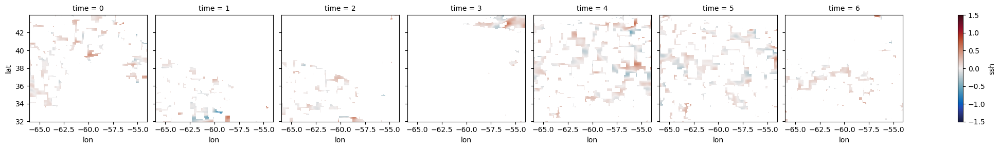

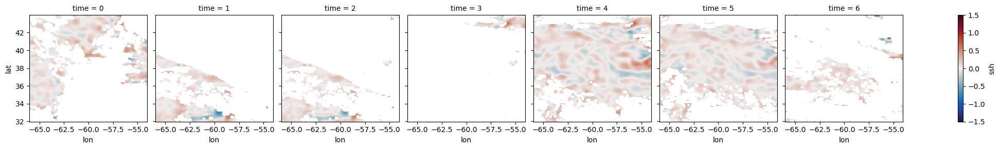

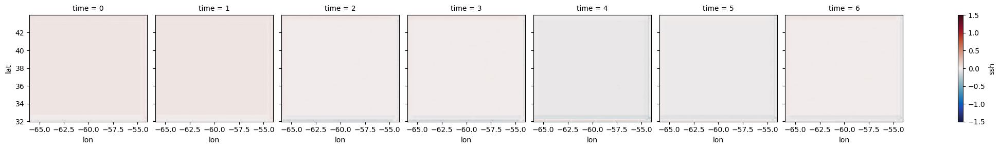

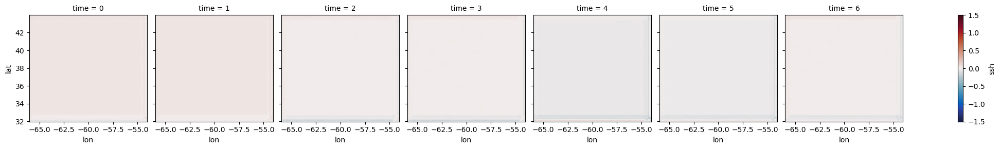

tensor(-0.0139, device='cuda:0', grad_fn=<MeanBackward0>) tensor(1.4139, device='cuda:0', grad_fn=<StdBackward0>)


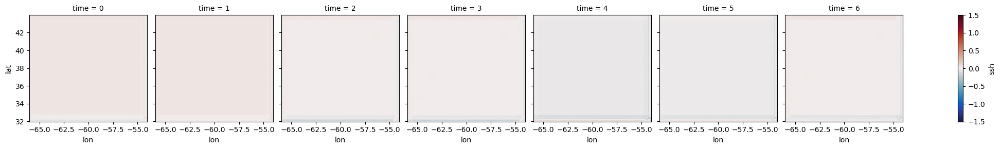

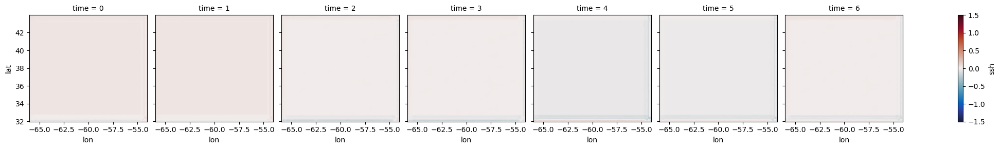

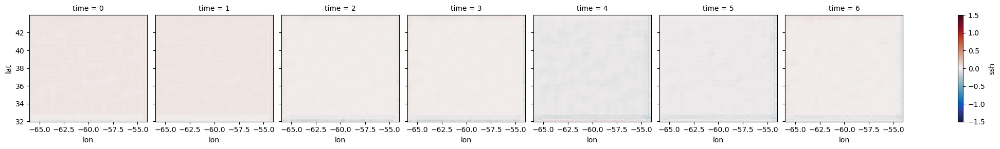

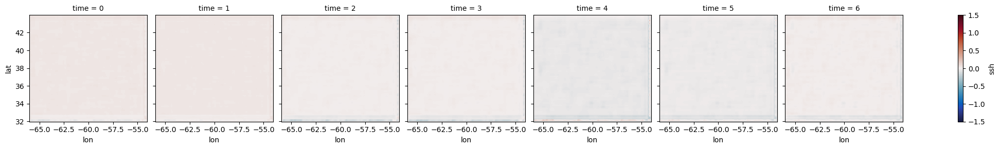

In [33]:
nt = 7

import cmocean as cmo
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),torch.where(y==0,np.nan,y).detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

import cmocean as cmo
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),torch.where(x==0,np.nan,x).detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

# obs-based
y = y.nan_to_num().to(device)
geo = torch.stack((batch.latv[:,0].nan_to_num(),
                                  batch.lonv[:,0].nan_to_num(),
                                  batch.land_mask[:,0].nan_to_num(),
                                  batch.topo[:,0].nan_to_num(),
                                  batch.fg_std[:,0].nan_to_num()), dim=1).to(device)
inp = torch.cat((y, geo),dim=1).to(device)
z1, mean, log_var = vae.encoder(inp)
x_hat = vae.decoder(z1)
xr_plt = xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)})
xr_plt.ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

z2, mean, log_var = vae.encoder(inp)
x_hat = vae.decoder(z2)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

print(torch.mean(z2-z1),torch.std(z2-z1))
# full obs-based
x = x.nan_to_num().to(device)
inp = torch.cat((x, geo),dim=1).to(device)
z, mean, log_var = vae.encoder(inp)
x_hat = vae.decoder(z)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

z, mean, log_var = vae.encoder(inp)
x_hat = vae.decoder(z)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

# pure generation
z = torch.Tensor(np.random.normal(size=z.size(), scale=1.0)).to(device)
x_hat = vae.decoder(z)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

z = torch.Tensor(np.random.normal(size=z.size(), scale=1.0)).to(device)
x_hat = vae.decoder(z)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

# AE training

In [12]:
ckpt = torch.load('/homes/m19beauc/4dvarnet-starter/ckpt/DMI/ckpt_ae_dmi.pth', map_location=device)
ae.load_state_dict(ckpt)

RuntimeError: Error(s) in loading state_dict for AE:
	size mismatch for decoder.0.weight: copying a param with shape torch.Size([4, 25, 1, 1]) from checkpoint, the shape in current model is torch.Size([4, 50, 1, 1]).

In [34]:
#@title Training (double click to expand or collapse)

from IPython.display import clear_output
from torch.optim import Adam
from tqdm.autonotebook import tqdm
from kornia.filters import box_blur

n_epochs =  1000#@param {'type':'integer'}
## learning rate
lr = 1e-4 #@param {'type':'number'}

optimizer = Adam(
        [
            {"params": ae.parameters(), "lr": lr}
        ],
    )

tqdm_epoch = tqdm(range(n_epochs))
for epoch in tqdm_epoch:
  avg_loss = 0.
  num_items = 0
  for batch in data_loader:
    y = batch[0]
    x = batch[1]
    if x.isfinite().float().mean() < 0.8:
        continue
    y = y.nan_to_num().to(device)
    geo = torch.stack((batch.latv[:,0].nan_to_num(),
                                  batch.lonv[:,0].nan_to_num(),
                                  batch.land_mask[:,0].nan_to_num(),
                                  batch.topo[:,0].nan_to_num(),
                                  batch.fg_std[:,0].nan_to_num()), dim=1).to(device)
    inp = torch.cat((y, geo),dim=1)
    z = ae.encoder(inp)
    x_hat = ae.decoder(z)
    loss_ae = ae.ae_loss(x.to(device), x_hat)
    loss = loss_ae
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    avg_loss += loss.item() * x.shape[0]
    num_items += x.shape[0]
  # Print the averaged training loss so far.
  tqdm_epoch.set_description('Average Loss: {:5f}'.format(avg_loss / num_items))
  # Update the checkpoint after each epoch of training.
  torch.save(ae.state_dict(), '../../ckpt/DMI/ckpt_ae_dmi.pth')

Average Loss: 0.096064:   0%|                | 4/1000 [01:31<6:20:18, 22.91s/it]


KeyboardInterrupt: 

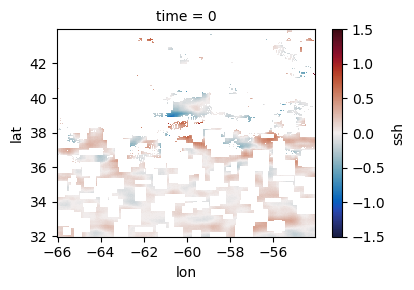

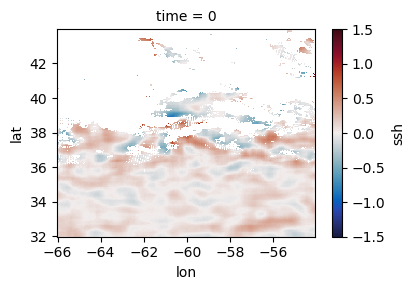

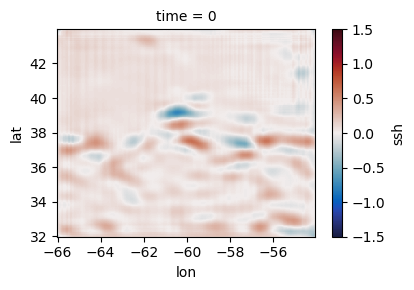

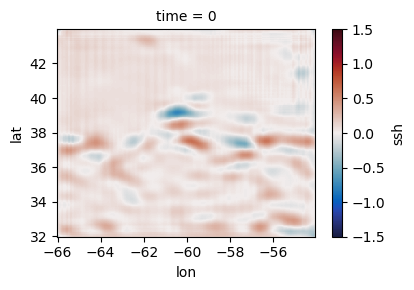

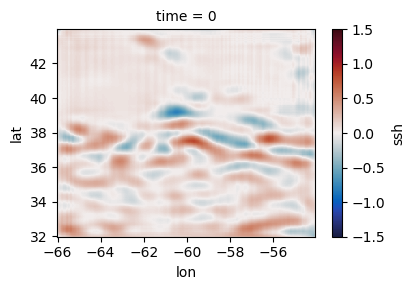

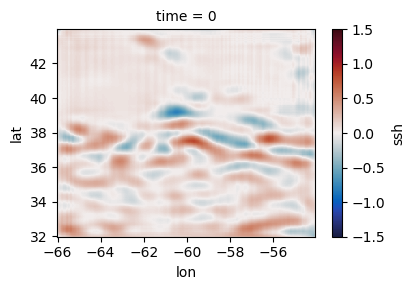

In [35]:
nt = 1

import cmocean as cmo
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),torch.where(y==0,np.nan,y).detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

import cmocean as cmo
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),torch.where(x==0,np.nan,x).detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

# obs-based
y = y.nan_to_num().to(device)
geo = torch.stack((batch.latv[:,0].nan_to_num(),
                                  batch.lonv[:,0].nan_to_num(),
                                  batch.land_mask[:,0].nan_to_num(),
                                  batch.topo[:,0].nan_to_num(),
                                  batch.fg_std[:,0].nan_to_num()), dim=1).to(device)
inp = torch.cat((y, geo),dim=1).to(device)
z1 = ae.encoder(inp)
x_hat = ae.decoder(z1)
xr_plt = xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)})
xr_plt.ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

z2 = ae.encoder(inp)#+1
x_hat = ae.decoder(z2)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

# full obs-based
x = x.nan_to_num().to(device)
inp = torch.cat((x, geo),dim=1).to(device)
z = ae.encoder(inp)
x_hat = ae.decoder(z)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

z = ae.encoder(inp)
x_hat = ae.decoder(z)
xr.Dataset(data_vars={'ssh':(('time','lat','lon'),x_hat.detach().cpu()[0])},
           coords={'time':np.arange(nt),
                   'lon':np.arange(-66, -54, 0.05),
                   'lat':np.arange(32, 44, 0.05)}).ssh.plot(col='time',col_wrap=nt,vmin=-1.5,vmax=1.5,cmap=cmo.cm.balance)
plt.show()

# OLD

In [12]:
class VAE(nn.Module):
    def __init__(self, input_shape, z_dim):
        super().__init__()

        self.dim_in = input_shape[0]
        self.z_dim = z_dim
        self.input_shape = input_shape

        # encoder
        self.encoder_conv = nn.Sequential(
            nn.Conv2d(self.dim_in, 30, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(30, 60, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(60, 120, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.conv_out_size = self._get_conv_out_size(input_shape)
        self.mu = nn.Sequential(
            nn.Linear(self.conv_out_size, z_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.2)
        )

        self.log_var = nn.Sequential(
            nn.Linear(self.conv_out_size, z_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.2)
        )

        # decoder
        self.decoder_linear = nn.Sequential(
            nn.Linear(z_dim, self.conv_out_size),
            nn.LeakyReLU(),
            nn.Dropout(0.2)
        )

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(120, 60, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(60, 30, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(30, self.dim_in-5, 3, stride=2, padding=1, output_padding=1)
        )
        
    def encode(self, x):
        
        x = self.encoder_conv(x)
        x = x.view(x.size()[0], -1)
        mu_p = self.mu(x)
        log_var_p = self.log_var(x)
        return mu_p, log_var_p

    def reparametrization(self, mu, log_var):
        epsilon = torch.Tensor(np.random.normal(size=(self.z_dim), scale=1.0))
        epsilon = epsilon.to(mu.device)
        return mu + epsilon * torch.exp(log_var / 2)
    
    def encoder(self,x):
        mean, log_var = self.encode(x)
        z = self.reparametrization(mean, log_var)
        return z, mean, log_var

    def decode(self, x):
        x = self.decoder_linear(x)
        x = x.view(x.size()[0], *self.conv_out_shape[1:])
        x = self.decoder_conv(x)
        return x

    def decoder(self, x):
        x = self.decode(x)
        return x

    def forward(self, x):
        mu_p, log_var_p = self.encode(x)
        x = self.reparametrization(mu_p, log_var_p)
        images_p = self.decode(x)
        return mu_p, log_var_p, images_p

    def project_latent_space(self,x):
        mu_p, log_var_p = self.encode(x)
        x = self.reparametrization(mu_p, log_var_p)
        return x

    
    def vae_loss(self, x, x_hat, mean, log_var, wKL=.01):
        err = x_hat-x
        err_grad = sobel(x_hat)-sobel(x)
        mask = torch.isnan(err)
        mask_grad = torch.isnan(err_grad)
        zeros= torch.zeros(err.size()).to(device)
        
        
        reproduction_loss = nn.functional.mse_loss(err[~mask], zeros[~mask], reduction='mean')
        #reproduction_loss = nn.functional.l1_loss(err[~mask], zeros[~mask], reduction='mean')

        #log_sigma_opt = 0.5 * reproduction_loss.log()
        grad_reproduction_loss = nn.functional.mse_loss(err_grad[~mask_grad], zeros[~mask_grad], reduction='mean')
        #log_sigma_opt_grad = 0.5 * grad_reproduction_loss.log()
        
        #reproduction_loss = 0.5 * torch.pow(err[~mask]/log_sigma_opt.exp(), 2) + log_sigma_opt
        #reproduction_loss = reproduction_loss.sum()
        #grad_reproduction_loss = 0.5 * torch.pow(err_grad[~mask]/log_sigma_opt_grad.exp(), 2) + log_sigma_opt_grad
        #grad_reproduction_loss = grad_reproduction_loss.sum()        
        
        KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())
        #return reproduction_loss + 100.*grad_reproduction_loss + wKL*KLD, reproduction_loss, KLD
        return reproduction_loss  + wKL*KLD, reproduction_loss, KLD
        #return reproduction_loss, reproduction_loss, KLD

    def _get_conv_out_size(self, shape):
        out = self.encoder_conv(torch.zeros(1, *shape))
        self.conv_out_shape = out.size()
        return int(np.prod(self.conv_out_shape))
  
vae = VAE(input_shape=(1+5,240,240), z_dim=200).to(device)